<center><h1 style='background-color:#99ccff;padding:10px;font-family:courier'>📗 About Dataset</h1></center>

This dataset contains information about various attributes of a set of fruits, providing insights into their characteristics. The dataset includes details such as fruit ID, size, weight, sweetness, crunchiness, juiciness, ripeness, acidity, and quality.

<center><h1 style='background-color:#99ccff;padding:10px;font-family:courier'>📗 Key Features:</h1></center>
    
- A_id: Unique identifier for each fruit
    
- Size: Size of the fruit
    
- Weight: Weight of the fruit
    
- Sweetness: Degree of sweetness of the fruit
    
- Crunchiness: Texture indicating the crunchiness of the fruit
    
- Juiciness: Level of juiciness of the fruit
    
- Ripeness: Stage of ripeness of the fruit
    
- Acidity: Acidity level of the fruit
    
- Quality: Overall quality of the fruit

Dataset : https://www.kaggle.com/datasets/nelgiriyewithana/apple-quality/data

<center><h1 style='background-color:#99ccff;padding:10px;font-family:courier'>📗 Load libraries¶:</h1></center>

In [1]:
import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
import warnings as wr
wr.filterwarnings('ignore')

from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import classification_report,accuracy_score,precision_score
from sklearn.metrics import confusion_matrix,roc_curve,recall_score,f1_score,roc_auc_score

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
# Data manipulation
#==============================================================================
import pandas as pd
pd.set_option("display.max_columns", None)
import numpy as np

# Stats
#==============================================================================
from scipy import stats
import statsmodels.api as sm
# import pingouin as pg

# Data visualization
#==============================================================================
import matplotlib.pyplot as plt
import seaborn as sns

# Data preprocessing
#===============================================================================
from sklearn.model_selection import train_test_split as tts

# Models
#===============================================================================
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.ensemble import VotingClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
# from catboost import CatBoostClassifier

import tensorflow as tf
from keras.layers import Dense, Input, Dropout
from keras.models import Model
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras.models import load_model

# Metrics
#===============================================================================
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import roc_curve, roc_auc_score
from sklearn.metrics import precision_recall_curve

# tqdm
#===============================================================================
from tqdm.auto import tqdm

# warnings
#===============================================================================
import warnings
warnings.filterwarnings("ignore")

<center><h1 style='background-color:#99ccff;padding:10px;font-family:courier'>📗 Load Data</h1></center>

In [3]:
data = pd.read_csv("/kaggle/input/apple-quality/apple_quality.csv")
data.head()

,A_id,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity,Quality
0,0.0,-3.970049,-2.512336,5.346330,-1.012009,1.844900,0.329840,-0.491590483,good
1,1.0,-1.195217,-2.839257,3.664059,1.588232,0.853286,0.867530,-0.722809367,good
2,2.0,-0.292024,-1.351282,-1.738429,-0.342616,2.838636,-0.038033,2.621636473,bad
3,3.0,-0.657196,-2.271627,1.324874,-0.097875,3.637970,-3.413761,0.790723217,good
4,4.0,1.364217,-1.296612,-0.384658,-0.553006,3.030874,-1.303849,0.501984036,good


In [4]:
# Data set size
#================================
print(f'Rows: {data.shape[0]}')
print(f'Columns: {data.shape[1]}')

Rows: 4001
Columns: 9


In [5]:
# Dat set information
#=====================================
print("---------------------------------------------------")
print(" " * 12, "Dat set Information")
print("---------------------------------------------------")
print(data.info())

---------------------------------------------------
             Dat set Information
---------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4001 entries, 0 to 4000
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   A_id         4000 non-null   float64
 1   Size         4000 non-null   float64
 2   Weight       4000 non-null   float64
 3   Sweetness    4000 non-null   float64
 4   Crunchiness  4000 non-null   float64
 5   Juiciness    4000 non-null   float64
 6   Ripeness     4000 non-null   float64
 7   Acidity      4001 non-null   object 
 8   Quality      4000 non-null   object 
dtypes: float64(7), object(2)
memory usage: 281.4+ KB
None


<center><h1 style='background-color:#99ccff;padding:10px;font-family:courier'>📗 EDA</h1></center>

In [6]:
# We eliminate the first id column since it does not add value to the analysis.
data = data.drop("A_id", axis = 1)
data.head()

,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity,Quality
0,-3.970049,-2.512336,5.346330,-1.012009,1.844900,0.329840,-0.491590483,good
1,-1.195217,-2.839257,3.664059,1.588232,0.853286,0.867530,-0.722809367,good
2,-0.292024,-1.351282,-1.738429,-0.342616,2.838636,-0.038033,2.621636473,bad
3,-0.657196,-2.271627,1.324874,-0.097875,3.637970,-3.413761,0.790723217,good
4,1.364217,-1.296612,-0.384658,-0.553006,3.030874,-1.303849,0.501984036,good


In [7]:
# Convert the "Acidity" column to float type.
# This will generate a NaN value since there is a string that could not be
# convert to float type.
#===================================================
data['Acidity'] = pd.to_numeric(data['Acidity'], errors = 'coerce')

#### Duplicate rows

In [8]:
print(f'Total duplicate rows: {data.duplicated().sum()}')

Total duplicate rows: 0


#### Missing values

In [9]:
df_null_values = data.isnull().sum().to_frame().rename(columns = {0:'count'})
df_null_values['%'] = (df_null_values['count'] / len(data)) * 100.
df_null_values = df_null_values.sort_values('%', ascending = False)
df_null_values

,count,%
Size,1,0.024994
Weight,1,0.024994
Sweetness,1,0.024994
Crunchiness,1,0.024994
Juiciness,1,0.024994
Ripeness,1,0.024994
Acidity,1,0.024994
Quality,1,0.024994


In [10]:
# We look for where the missing values ​​are located.
#====================================================================0
data[data.isnull().any(axis = 1)]

,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity,Quality
4000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
# Because it's only one row, we're going to proceed to delete it.
#==========================================================================
data = data.dropna(ignore_index = True)

# We check that there are no longer missing values.
#==================================================================
data.isnull().sum()

Size           0
Weight         0
Sweetness      0
Crunchiness    0
Juiciness      0
Ripeness       0
Acidity        0
Quality        0
dtype: int64

#### Univariate Analysis

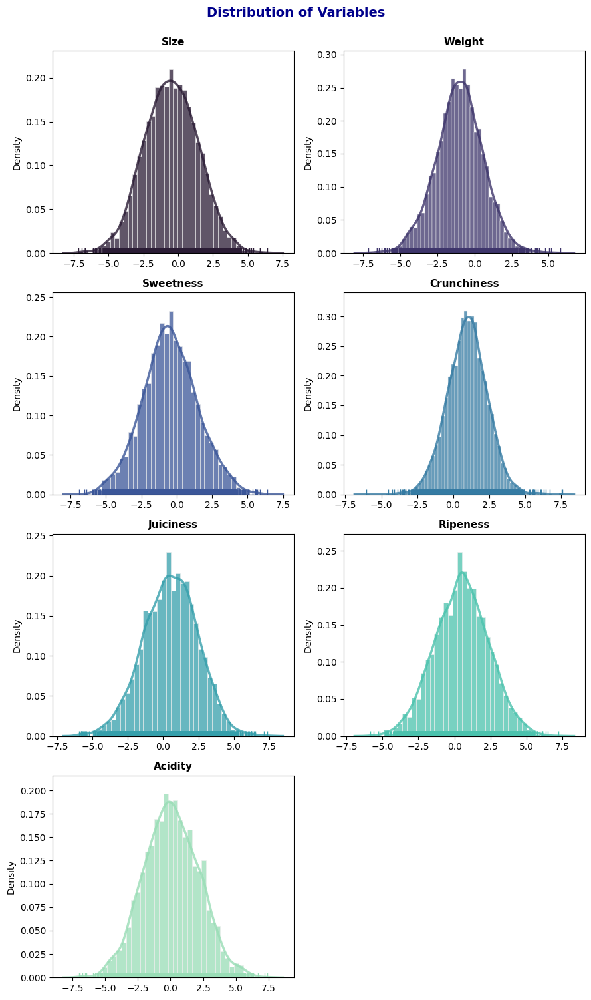

In [12]:
cols = data.columns.to_list()[:-1]
colors = sns.color_palette('mako', len(cols))

fig,axs = plt.subplots(nrows = 4, ncols = 2, figsize = (9,15))
plt.style.use("ggplot")
axs= axs.flat

for i,col in enumerate(cols):
    sns.kdeplot(data, x = col, alpha = 0.8, linewidth = 2.5, color = colors[i], ax = axs[i])
    sns.histplot(data, x = col, stat = 'density', color = colors[i], ax = axs[i])
    sns.rugplot(data, x = col, color = colors[i], ax = axs[i])
    axs[i].set_xlabel("")
    axs[i].set_title(col, fontsize = 11, fontweight = "bold", color = "black")
    
fig.suptitle("Distribution of Variables", fontsize = 14, fontweight = "bold", color = "darkblue", y = 0.998)
fig.delaxes(ax = axs[7])
fig.tight_layout()
fig.show()

In [13]:
# Descriptive statistics
#===============================================
data[cols].describe().T

,count,mean,std,min,25%,50%,75%,max
Size,4000.0,-0.503015,1.928059,-7.151703,-1.816765,-0.513703,0.805526,6.406367
Weight,4000.0,-0.989547,1.602507,-7.149848,-2.011770,-0.984736,0.030976,5.790714
Sweetness,4000.0,-0.470479,1.943441,-6.894485,-1.738425,-0.504758,0.801922,6.374916
Crunchiness,4000.0,0.985478,1.402757,-6.055058,0.062764,0.998249,1.894234,7.619852
Juiciness,4000.0,0.512118,1.930286,-5.961897,-0.801286,0.534219,1.835976,7.364403
Ripeness,4000.0,0.498277,1.874427,-5.864599,-0.771677,0.503445,1.766212,7.237837
Acidity,4000.0,0.076877,2.110270,-7.010538,-1.377424,0.022609,1.510493,7.404736


In [14]:
print('-----------------------------------------------------')
print(' '*10, 'Kurtosis and Skewness')
print('-----------------------------------------------------')
for col in cols:
    print(f'* {col}: Kurtosis: {stats.kurtosis(data[col]):.4f}| Skewness: {stats.skew(data[col]):.4f}')

-----------------------------------------------------
           Kurtosis and Skewness
-----------------------------------------------------
* Size: Kurtosis: -0.0847| Skewness: -0.0024
* Weight: Kurtosis: 0.3571| Skewness: 0.0031
* Sweetness: Kurtosis: 0.0130| Skewness: 0.0838
* Crunchiness: Kurtosis: 0.7196| Skewness: 0.0002
* Juiciness: Kurtosis: 0.0272| Skewness: -0.1134
* Ripeness: Kurtosis: -0.0733| Skewness: -0.0088
* Acidity: Kurtosis: -0.0948| Skewness: 0.0558


#### Normality test

In [15]:
def normality_test(name:str):
    p_value = stats.normaltest(data[name])[1]
    decision = "No Normal Distribution" if p_value < 0.05 else "Normal Distribution"
    return decision

In [16]:
print("--------------------------------------------")
print(" "*5, "Normal Test: D' Agostino")
print("--------------------------------------------")
for col in cols:
    print(f'* {col}: {normality_test(col)}')

--------------------------------------------
      Normal Test: D' Agostino
--------------------------------------------
* Size: Normal Distribution
* Weight: No Normal Distribution
* Sweetness: Normal Distribution
* Crunchiness: No Normal Distribution
* Juiciness: No Normal Distribution
* Ripeness: Normal Distribution
* Acidity: Normal Distribution


According to the normality test, we have only 4 variables that come from a population with a Normal Distribution and they are the following:

- Size
- Sweetness
- Ripeness
- Acidity

Let's look at the class distribution of the target variable.

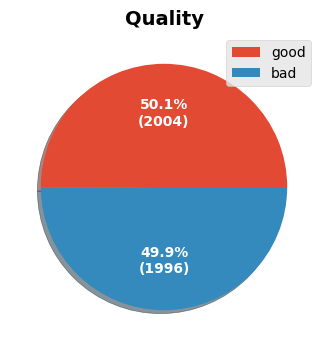

In [17]:
df_quality = data['Quality'].value_counts().to_frame()
labels = df_quality.index.to_list()
values = df_quality.iloc[:,0].to_list()

def autopct_fun(abs_values):
    gen = iter(abs_values)
    return lambda pct: f"{pct:.1f}%\n({next(gen)})"

fig,ax = plt.subplots(figsize = (4,4))
ax.pie(x = values, labels = labels, autopct=autopct_fun(values), shadow = True, textprops = {'color':'white', 'fontsize':10, 'fontweight':'bold'})
ax.legend(labels)
ax.set_title("Quality", fontsize = 14, fontweight = "bold", color = "black")
fig.show()

Wow!! This shows the target is highly balanced, so we luckily don't have to consider techniques like under/over-sampling

#### boxplots

Q1: -2.01177029275
Q2 (Median): -0.9847364865
Q3: 0.03097644
Min: -7.149847675
Max: 5.79071359


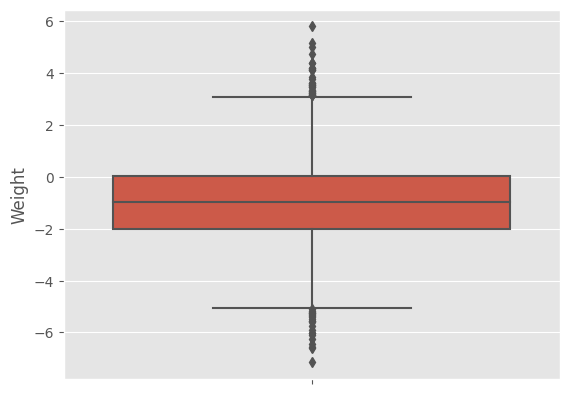

------------------------------------------------------------------------------------------------------------------------------------------------------
Q1: -1.7384250625
Q2 (Median): -0.5047584635
Q3: 0.8019219209999999
Min: -6.894485494
Max: 6.374915513


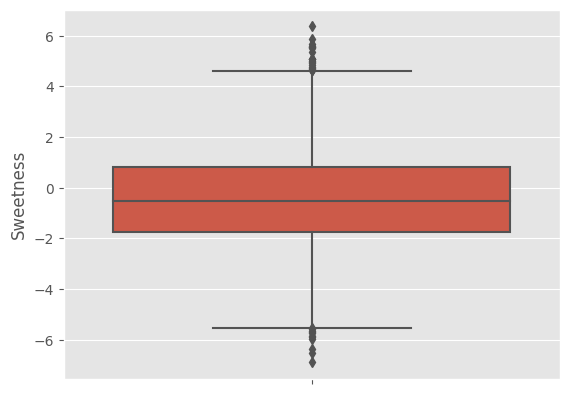

------------------------------------------------------------------------------------------------------------------------------------------------------
Q1: 0.06276439525000001
Q2 (Median): 0.9982494390000001
Q3: 1.8942342170000002
Min: -6.055057805
Max: 7.619851801


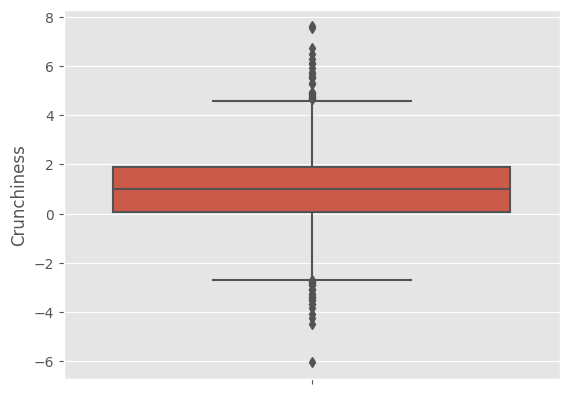

------------------------------------------------------------------------------------------------------------------------------------------------------
Q1: -0.80128581525
Q2 (Median): 0.5342186584999999
Q3: 1.8359763875
Min: -5.961897048
Max: 7.364402864


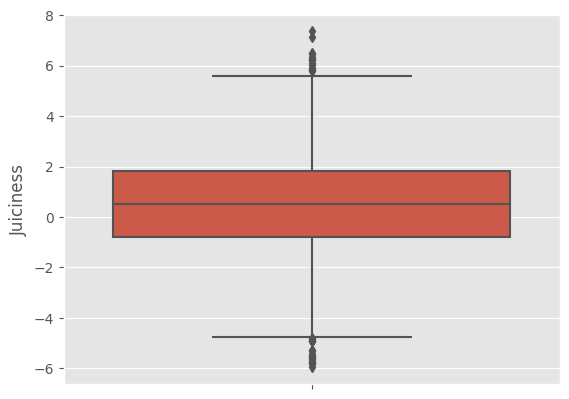

------------------------------------------------------------------------------------------------------------------------------------------------------
Q1: -0.7716768665
Q2 (Median): 0.5034447135
Q3: 1.76621164075
Min: -5.864598918
Max: 7.237836684


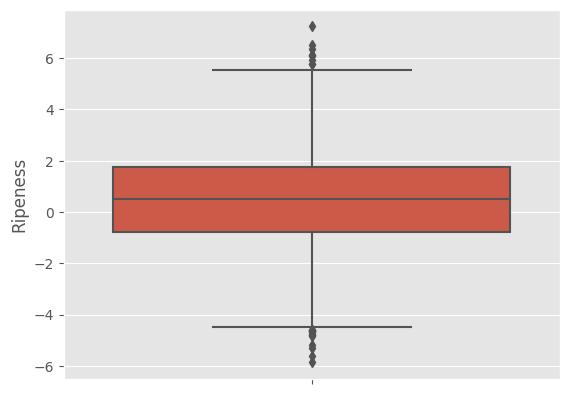

------------------------------------------------------------------------------------------------------------------------------------------------------
Q1: -1.3774240784999998
Q2 (Median): 0.022608968
Q3: 1.510492756
Min: -7.010538475
Max: 7.404736238


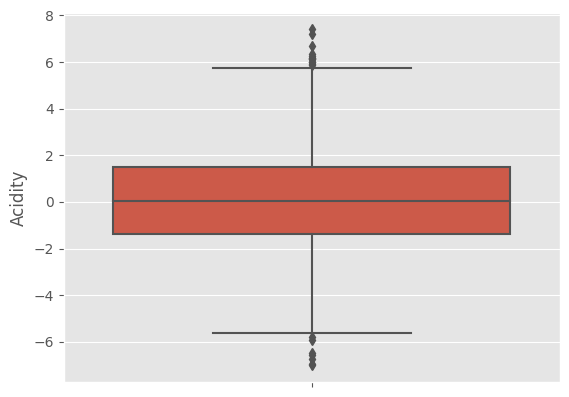

------------------------------------------------------------------------------------------------------------------------------------------------------


In [18]:
for column in data.columns[1:-1]:
    q1 = np.percentile(data[column], 25)
    q2 = np.percentile(data[column], 50)
    q3 = np.percentile(data[column], 75)
    data_min = np.min(data[column])
    data_max = np.max(data[column])
    
    print("Q1:", q1)
    print("Q2 (Median):", q2)
    print("Q3:", q3)
    print("Min:", data_min)
    print("Max:", data_max)
    sns.boxplot(data=data,y = column, hue='Quality')
    plt.show()
    print('-' * 150)

#### histograms

Q1: -2.01177029275
Q2 (Median): -0.9847364865
Q3: 0.03097644
Min: -7.149847675
Max: 5.79071359
Q2 (Median): -0.9847364865


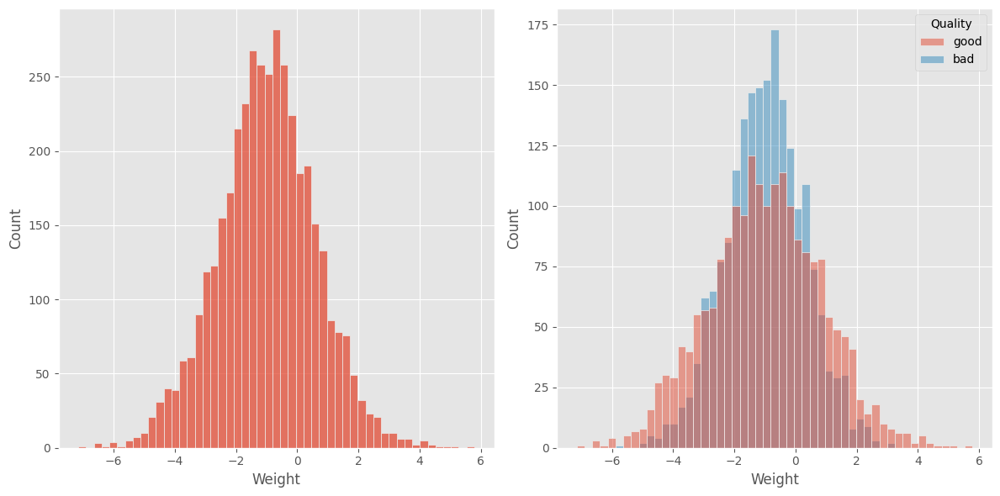

------------------------------------------------------------------------------------------------------------------------------------------------------
Q1: -1.7384250625
Q2 (Median): -0.5047584635
Q3: 0.8019219209999999
Min: -6.894485494
Max: 6.374915513
Q2 (Median): -0.5047584635


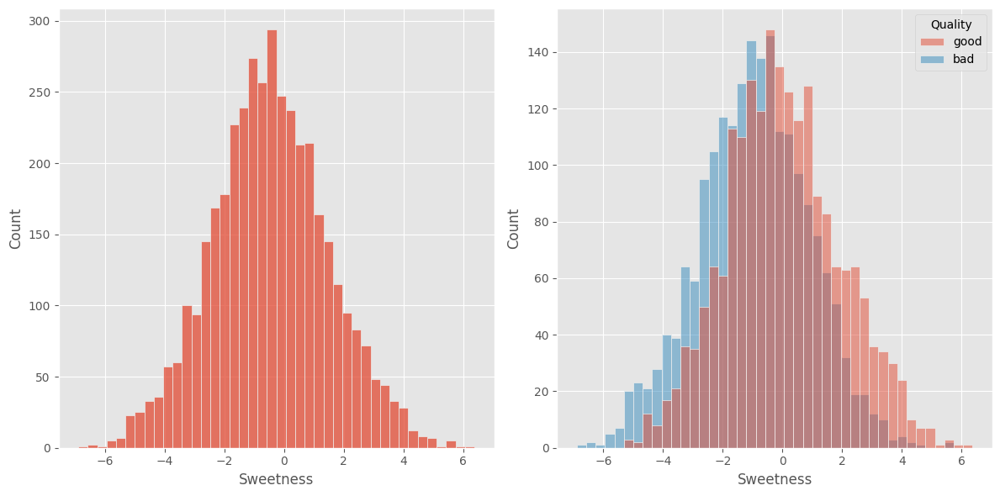

------------------------------------------------------------------------------------------------------------------------------------------------------
Q1: 0.06276439525000001
Q2 (Median): 0.9982494390000001
Q3: 1.8942342170000002
Min: -6.055057805
Max: 7.619851801
Q2 (Median): 0.9982494390000001


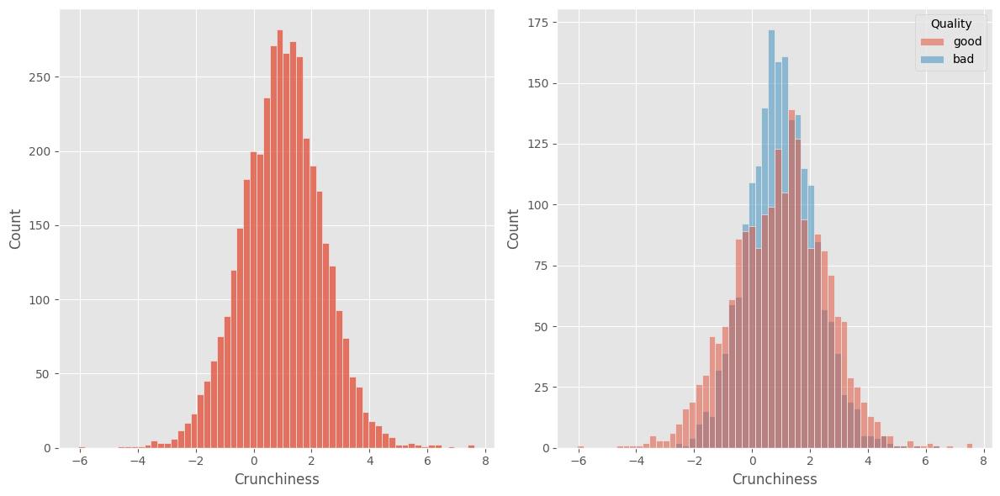

------------------------------------------------------------------------------------------------------------------------------------------------------
Q1: -0.80128581525
Q2 (Median): 0.5342186584999999
Q3: 1.8359763875
Min: -5.961897048
Max: 7.364402864
Q2 (Median): 0.5342186584999999


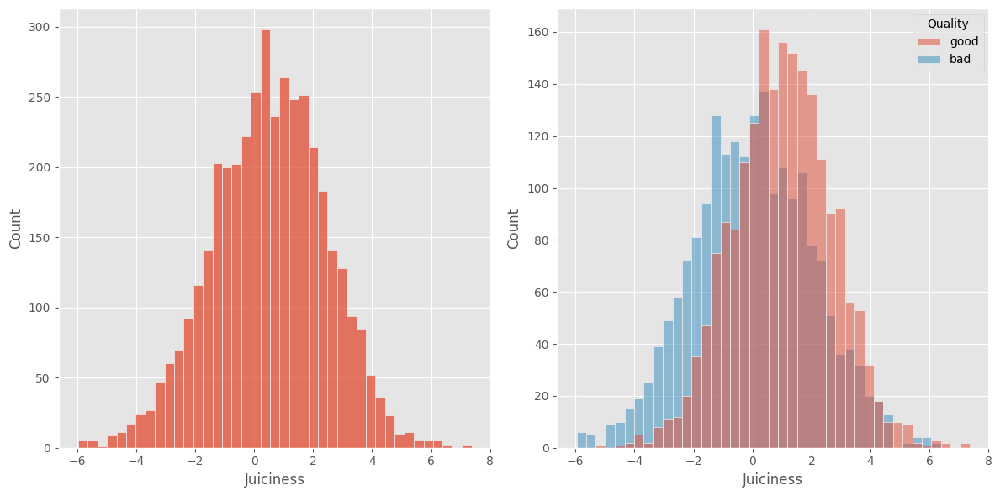

------------------------------------------------------------------------------------------------------------------------------------------------------
Q1: -0.7716768665
Q2 (Median): 0.5034447135
Q3: 1.76621164075
Min: -5.864598918
Max: 7.237836684
Q2 (Median): 0.5034447135


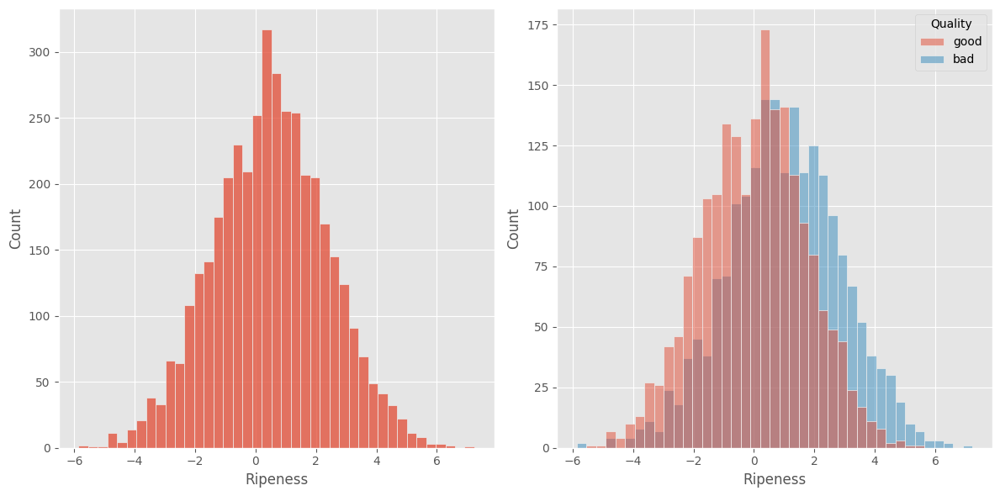

------------------------------------------------------------------------------------------------------------------------------------------------------
Q1: -1.3774240784999998
Q2 (Median): 0.022608968
Q3: 1.510492756
Min: -7.010538475
Max: 7.404736238
Q2 (Median): 0.022608968


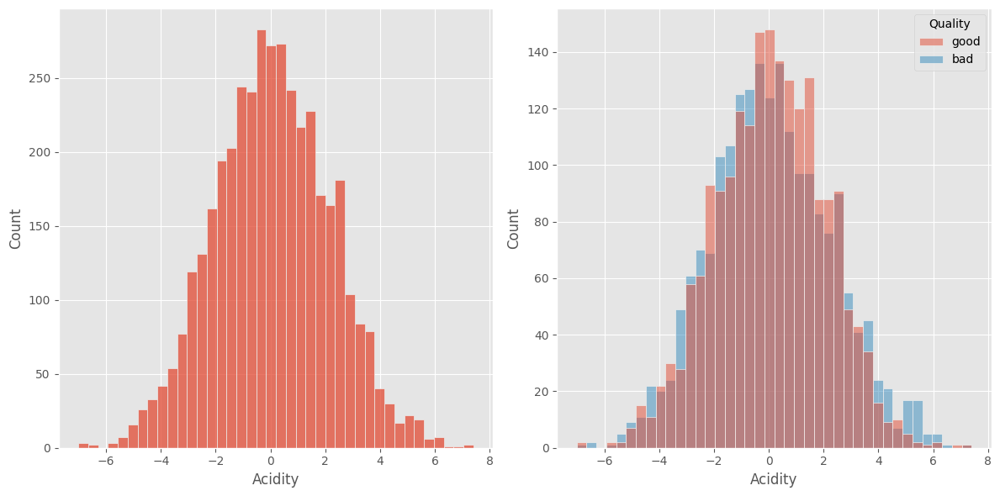

------------------------------------------------------------------------------------------------------------------------------------------------------


In [19]:
for column in data.columns[1:-1]:
    
    q1 = np.percentile(data[column], 25)
    q2 = np.percentile(data[column], 50)
    q3 = np.percentile(data[column], 75)
    data_min = np.min(data[column])
    data_max = np.max(data[column])
    
    print("Q1:", q1)
    print("Q2 (Median):", q2)
    print("Q3:", q3)
    print("Min:", data_min)
    print("Max:", data_max)
    print("Q2 (Median):", q2)
    
    #creating a subplot
    plt.figure(figsize=(12,6))
    plt.subplot(1,2,1)
    sns.histplot(data=data,x = column)
    
    plt.subplot(1,2,2)
    sns.histplot(data=data,x = column, hue= 'Quality')
    plt.tight_layout()
    plt.show()
   
    print('-' * 150)

#### Scatterplot

Correlation between Size and Sweetness is -0.32468024956214553


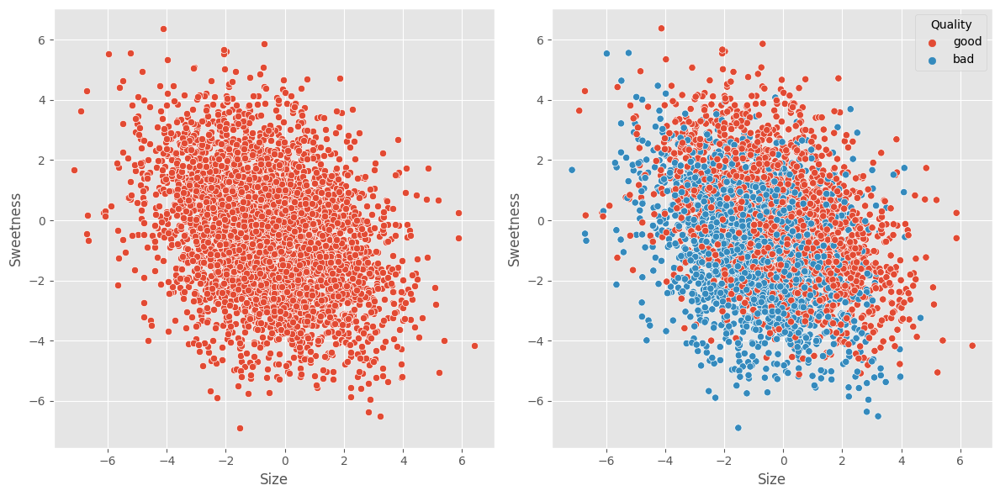

In [20]:
# creating a subplot for size vs sweetness
print(f"Correlation between Size and Sweetness is {data['Size'].corr(data['Sweetness'])}")
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.scatterplot(data=data,x='Size', y='Sweetness'); # size vs sweetness correlation :- -0.32
    
plt.subplot(1,2,2)
sns.scatterplot(data=data,x='Size', y='Sweetness', hue='Quality'); # size vs sweetness correlation :- -0.32
plt.tight_layout()
plt.show()

Correlation between Ripeness and Weight is -0.24382426555524045


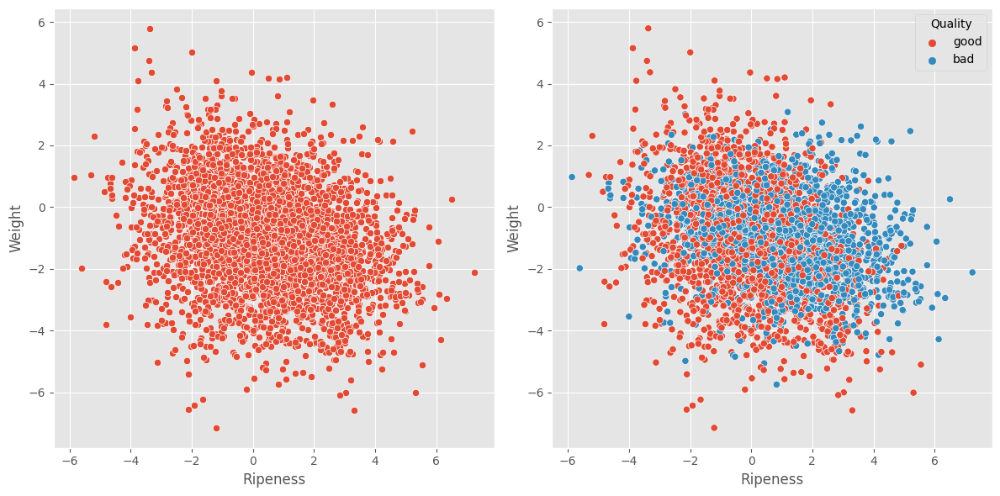

In [21]:
# creating a subplot for Ripeness vs Weight
print(f"Correlation between Ripeness and Weight is {data['Ripeness'].corr(data['Weight'])}")
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.scatterplot(data=data,x='Ripeness', y='Weight')# Ripeness vs Weight correlation :- -0.24
    
plt.subplot(1,2,2)
sns.scatterplot(data=data,x='Ripeness', y='Weight', hue='Quality'); # Ripeness vs Weight correlation :- -0.24
plt.tight_layout()
plt.show()

Correlation between Sweetness and Ripeness is -0.2738000675607009


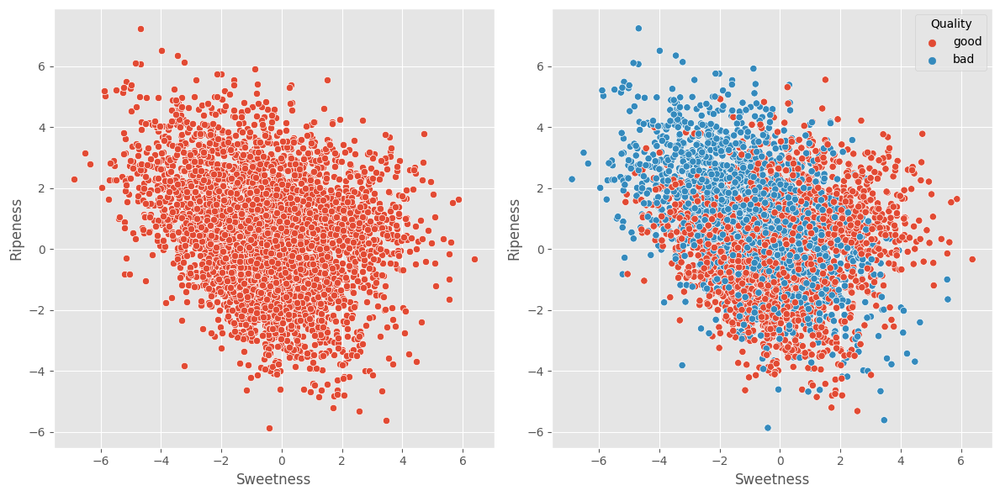

In [22]:
# creating a subplot for Sweetness vs Ripeness
print(f"Correlation between Sweetness and Ripeness is {data['Sweetness'].corr(data['Ripeness'])}")
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.scatterplot(data=data,x='Sweetness', y='Ripeness')
    
plt.subplot(1,2,2)
sns.scatterplot(data=data,x='Sweetness', y='Ripeness', hue='Quality');
plt.tight_layout()
plt.show()

Correlation between Crunchiness and Ripeness is -0.2019816301087346


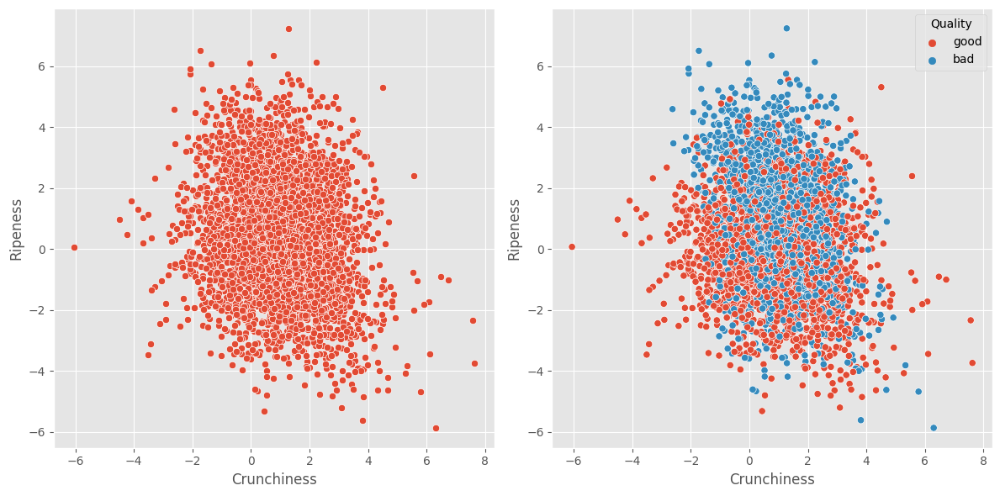

In [23]:
# creating a subplot for crunchiness vs Ripeness
print(f"Correlation between Crunchiness and Ripeness is {data['Crunchiness'].corr(data['Ripeness'])}")
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.scatterplot(data=data,x='Crunchiness', y='Ripeness')
    
plt.subplot(1,2,2)
sns.scatterplot(data=data,x='Crunchiness', y='Ripeness', hue='Quality');
plt.tight_layout()
plt.show()

Correlation between Crunchiness and Juiciness is -0.2596070855403654


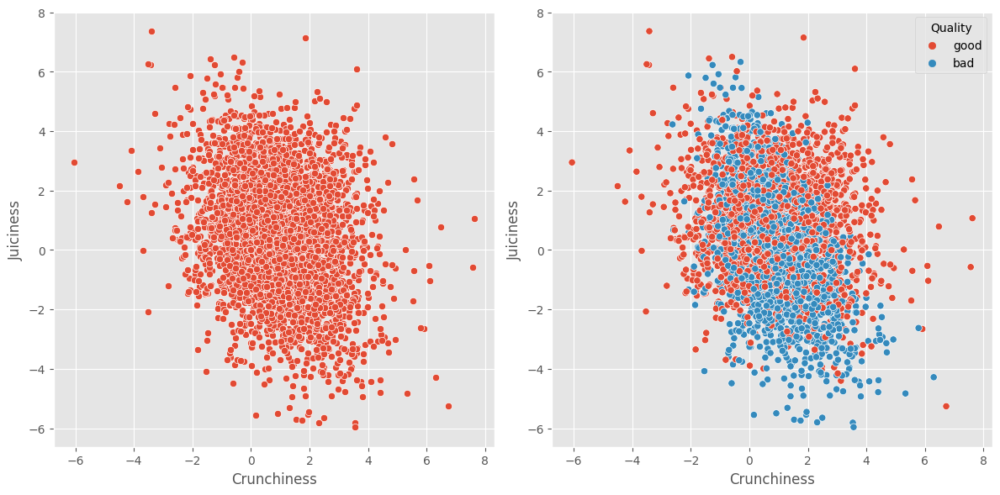

In [24]:
# creating a subplot for Crunchiness vs juiciness
print(f"Correlation between Crunchiness and Juiciness is {data['Crunchiness'].corr(data['Juiciness'])}")
plt.figure(figsize=(12,6))
plt.subplot(1,2,1)
sns.scatterplot(data=data,x='Crunchiness', y='Juiciness')
    
plt.subplot(1,2,2)
sns.scatterplot(data=data,x='Crunchiness', y='Juiciness', hue='Quality');
plt.tight_layout()
plt.show()

We see that the class distribution is balanced, so we will use accuracy as a metric.

- Bivariate Analysis

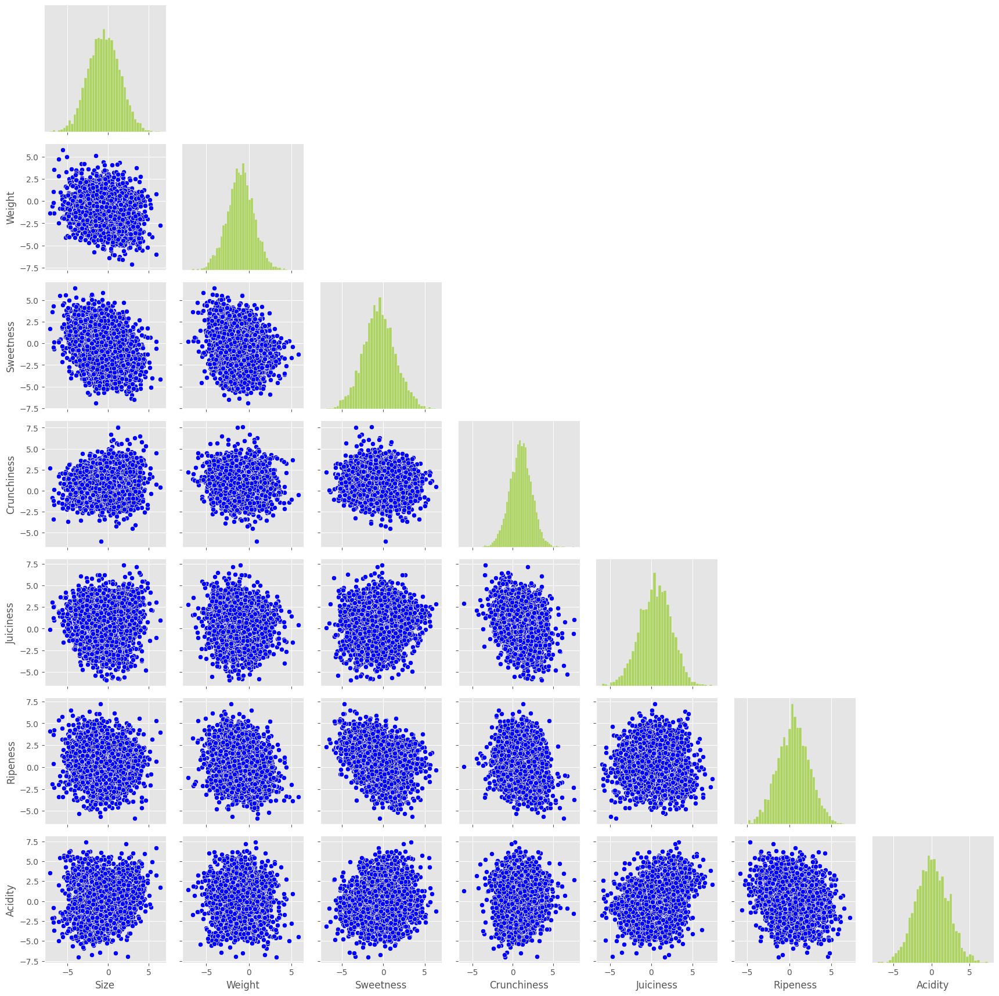

In [25]:
g = sns.PairGrid(data, corner = True)
g.map_lower(sns.scatterplot, color = 'blue')
g.map_diag(sns.histplot, color = 'yellowgreen')
g.fig.show()

According to the graph shown we can see that no pair of variables presents a correlation, we are going to create the correlation matrix, according to the result of the normality test, we only have 4 variables that come from a population with a Normal Distribution and the rest do not, so Therefore we will use a Spearman Correlation.

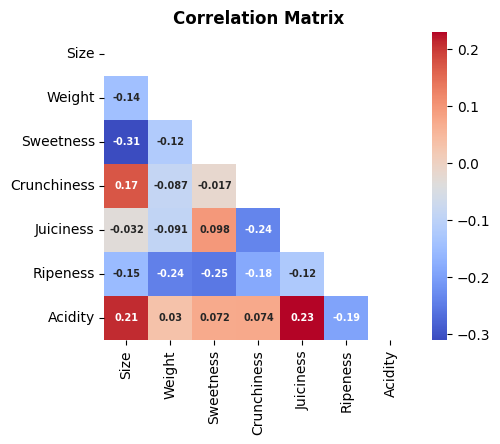

In [26]:
corr_matrix = data[cols].corr(method = 'spearman')
mask = np.triu(np.ones_like(corr_matrix, dtype = bool))

plt.figure(figsize = (5,4))
plt.style.use('default')
sns.heatmap(corr_matrix, cmap = 'coolwarm', annot = True, annot_kws = {'fontsize':7, 'fontweight':'bold'}, square = True, mask = mask)
plt.title("Correlation Matrix", fontsize = 12, fontweight = "bold")
plt.show()

According to the Correlation Matrix, no pair of variables presents a strong correlation to be taken into account.

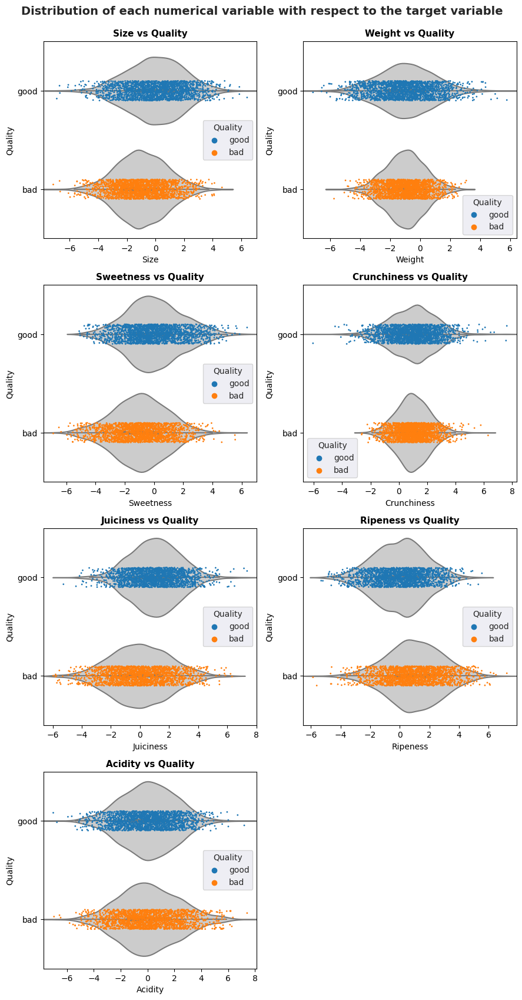

In [27]:
fig,axs = plt.subplots(nrows = 4, ncols = 2, figsize = (9,17))
sns.set_style('darkgrid')
axs = axs.flat

for i,col in enumerate(cols):
    sns.violinplot(data, x = col, y = 'Quality',color = '.8', ax = axs[i])
    sns.stripplot(data, x = col, y = 'Quality', size = 2, jitter  = 0.1, hue = 'Quality', ax = axs[i])
    axs[i].set_title(f'{col} vs Quality', fontsize = 11, fontweight = "bold")

fig.suptitle("Distribution of each numerical variable with respect to the target variable", fontsize = 14, fontweight = 'bold', y = 0.995)
fig.delaxes(ax = axs[7])
fig.tight_layout()
fig.show()

- Multivariate Analysis

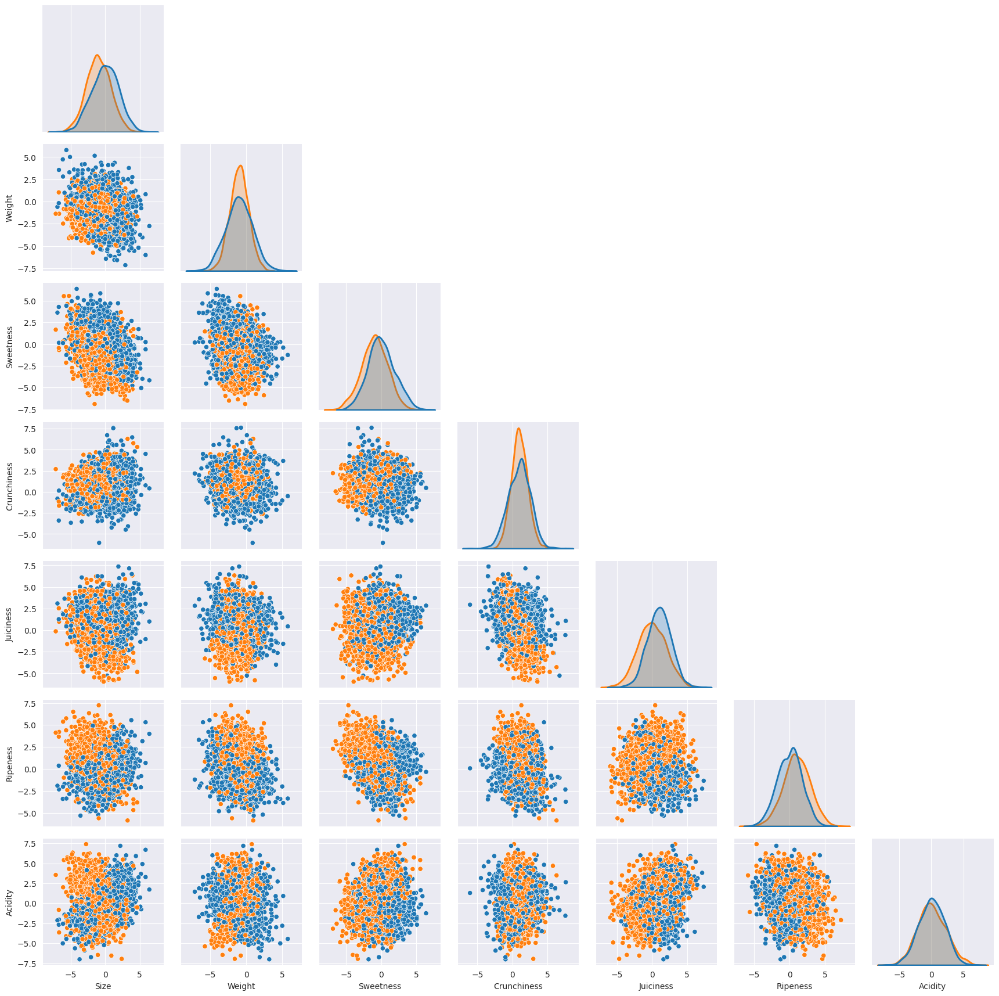

In [28]:
g = sns.PairGrid(data, hue = 'Quality', corner = True)
g.map_lower(sns.scatterplot)
g.map_diag(sns.kdeplot, fill = True, linewidth = 2.1)
g.fig.show()

### Displaying features

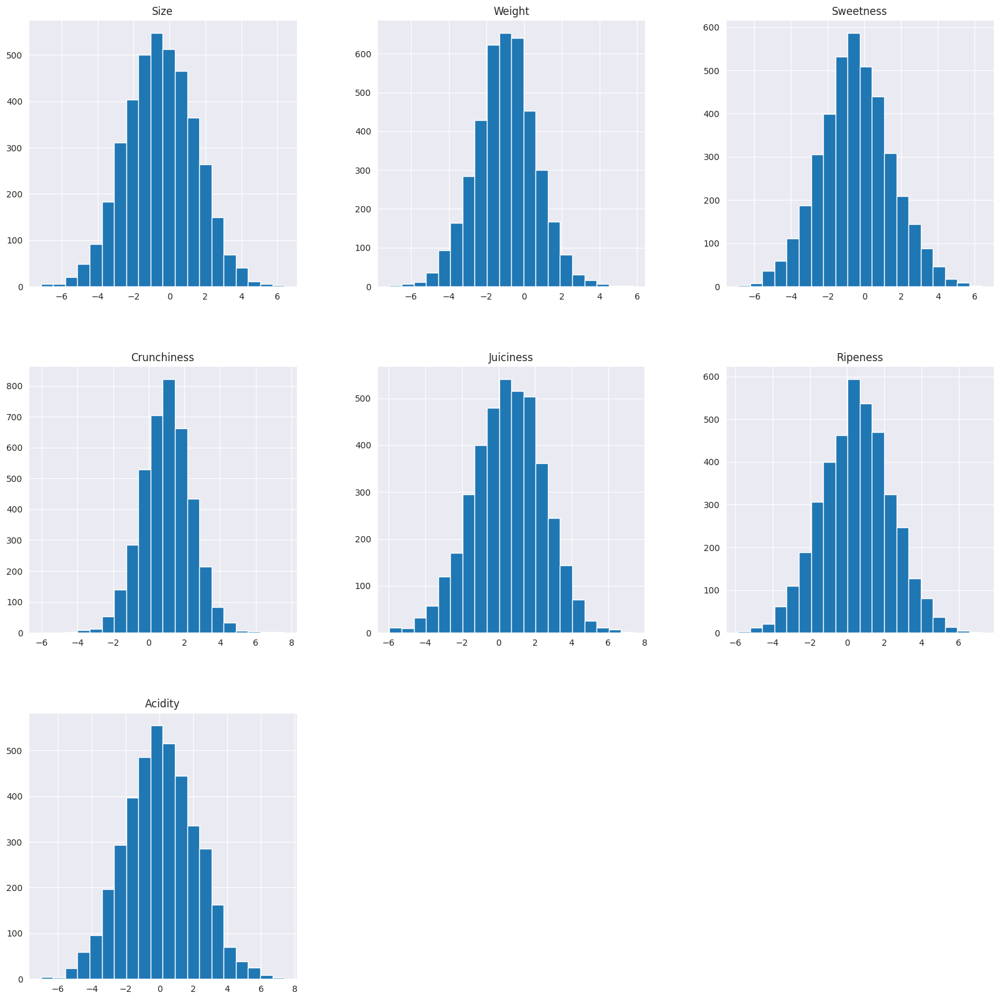

In [29]:
# Plotting each feature as histogram
data.hist(figsize=(20,20),bins=20);

### Visualization of distribution of features

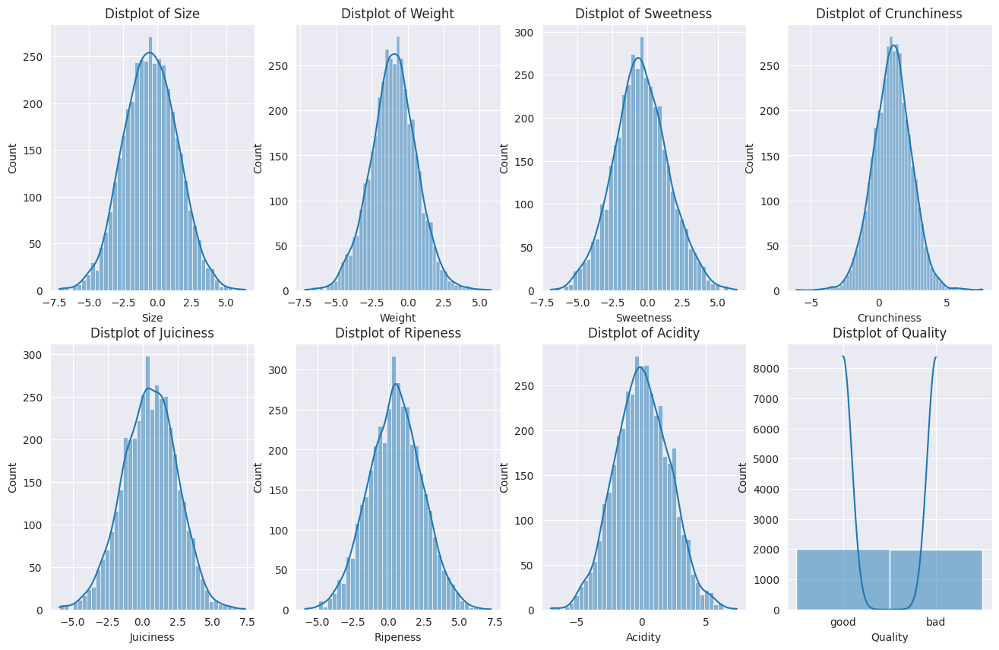

In [30]:
fig, axs=plt.subplots(nrows=2,ncols=4,figsize=(16,10))


axs = axs.flatten()

for i, column in enumerate(data.columns):
    sns.histplot(data[column], kde=True, ax=axs[i])
    axs[i].set_title(f'Distplot of {column}')

<center><h1 style='background-color:#99ccff;padding:10px;font-family:courier'>📗 Preprocessing target "Quality"</h1></center>

In [31]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

# Encoding the 'Quality' column
data['Quality'] = label_encoder.fit_transform(data['Quality'])

# Displaying the first few rows of the dataframe with the new encoded column
data.head()

,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity,Quality
0,-3.970049,-2.512336,5.346330,-1.012009,1.844900,0.329840,-0.491590,1
1,-1.195217,-2.839257,3.664059,1.588232,0.853286,0.867530,-0.722809,1
2,-0.292024,-1.351282,-1.738429,-0.342616,2.838636,-0.038033,2.621636,0
3,-0.657196,-2.271627,1.324874,-0.097875,3.637970,-3.413761,0.790723,1
4,1.364217,-1.296612,-0.384658,-0.553006,3.030874,-1.303849,0.501984,1


Correlation between quality and Size is 0.24400717867851293


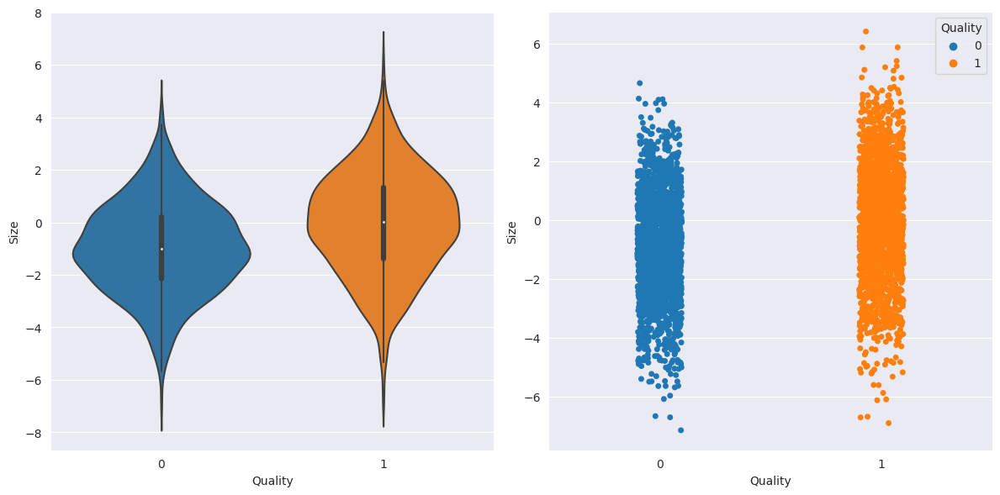

------------------------------------------------------------------------------------------------------------------------------------------------------
Correlation between quality and Weight is 0.0014209332584549604


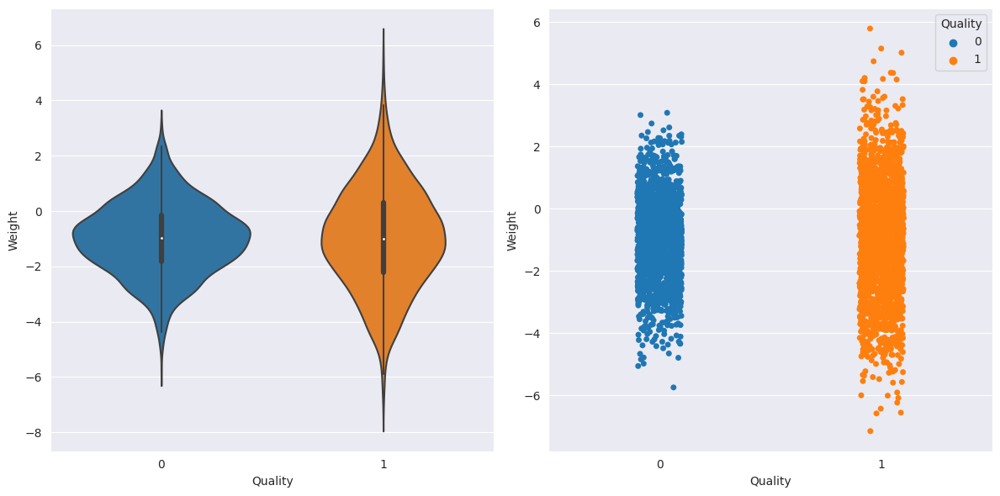

------------------------------------------------------------------------------------------------------------------------------------------------------
Correlation between quality and Sweetness is 0.25099845883651795


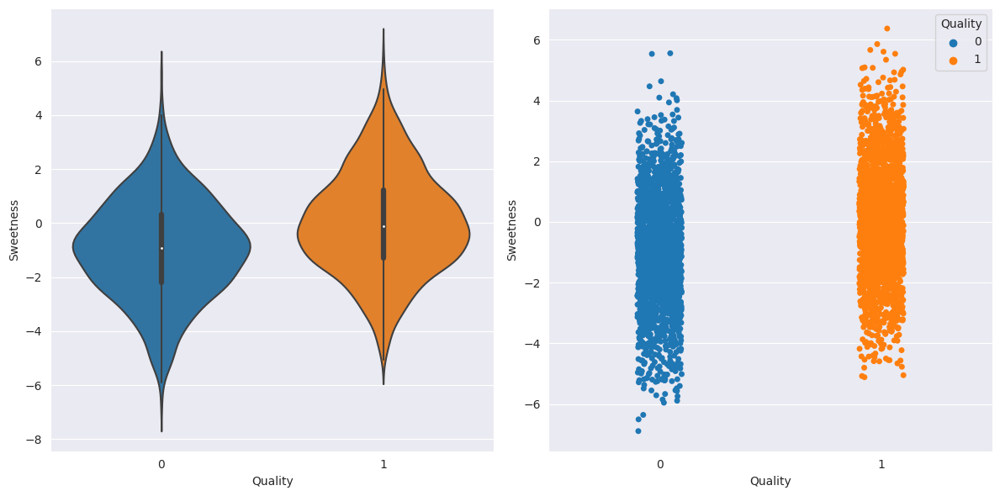

------------------------------------------------------------------------------------------------------------------------------------------------------
Correlation between quality and Crunchiness is -0.012376198047427409


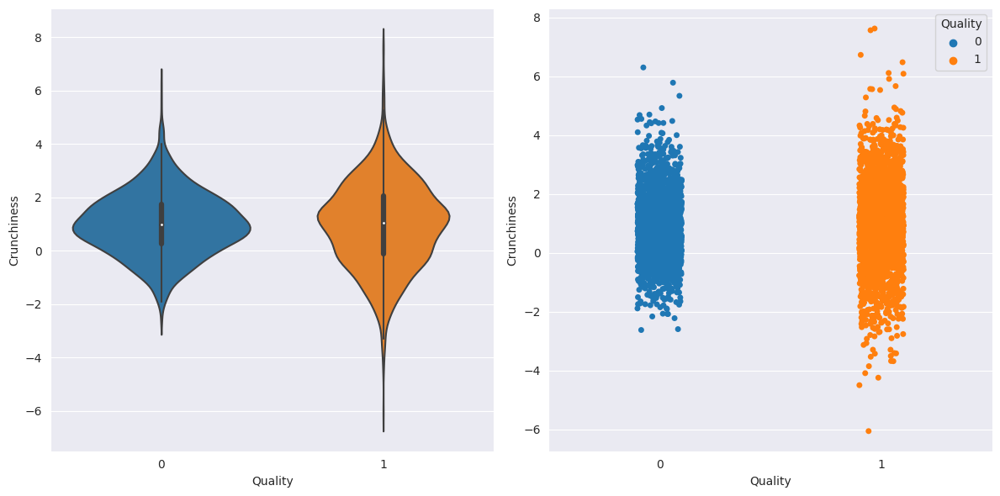

------------------------------------------------------------------------------------------------------------------------------------------------------
Correlation between quality and Juiciness is 0.2602225452952225


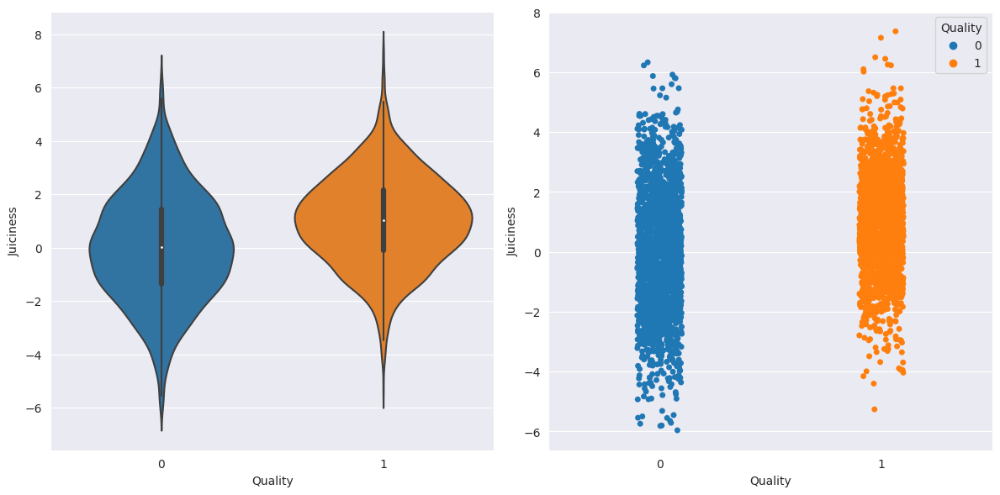

------------------------------------------------------------------------------------------------------------------------------------------------------
Correlation between quality and Ripeness is -0.2643148792459564


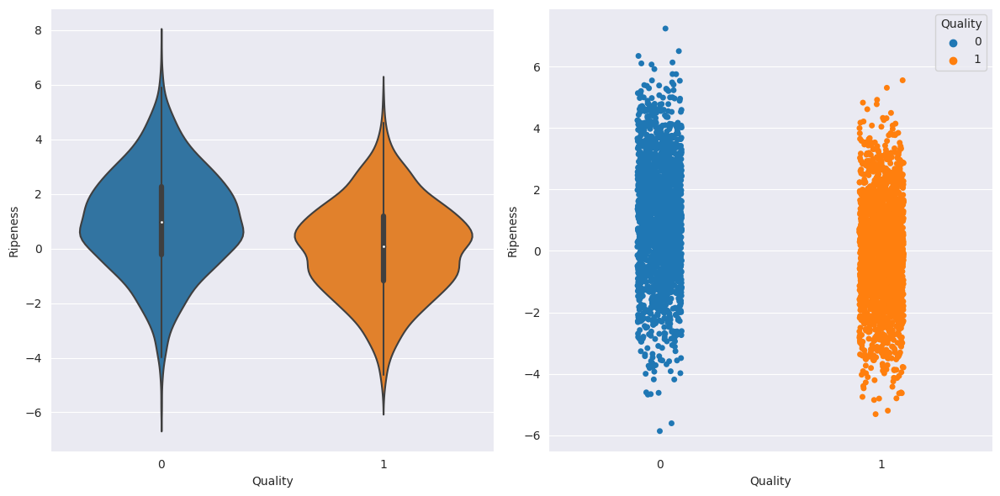

------------------------------------------------------------------------------------------------------------------------------------------------------
Correlation between quality and Acidity is -0.007697299826760263


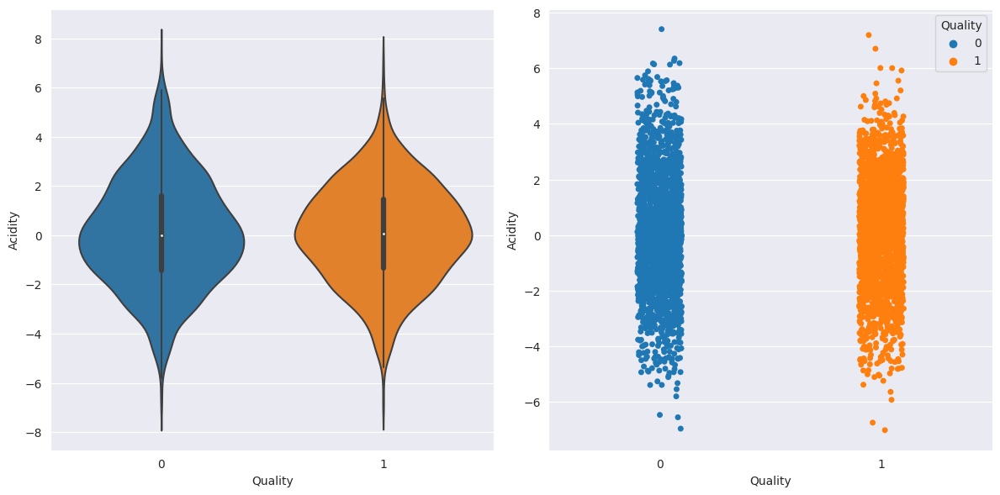

------------------------------------------------------------------------------------------------------------------------------------------------------


In [32]:
# Now let's Automate the violinplot and stripplot wrt 'Quality_encoded' column
for column in ['Size', 'Weight', 'Sweetness', 'Crunchiness', 'Juiciness',
       'Ripeness', 'Acidity']:
    print(f"Correlation between quality and {column} is {data['Quality'].corr(data[column])}")
    plt.figure(figsize=(12,6))
    plt.subplot(1,2,1)
    sns.violinplot(data=data,x='Quality', y=column)
    
    plt.subplot(1,2,2)
    sns.stripplot(data=data,x='Quality', y=column, hue='Quality');
    plt.tight_layout()
    plt.show()
    print('-' * 150)

#### Coorelation matrix

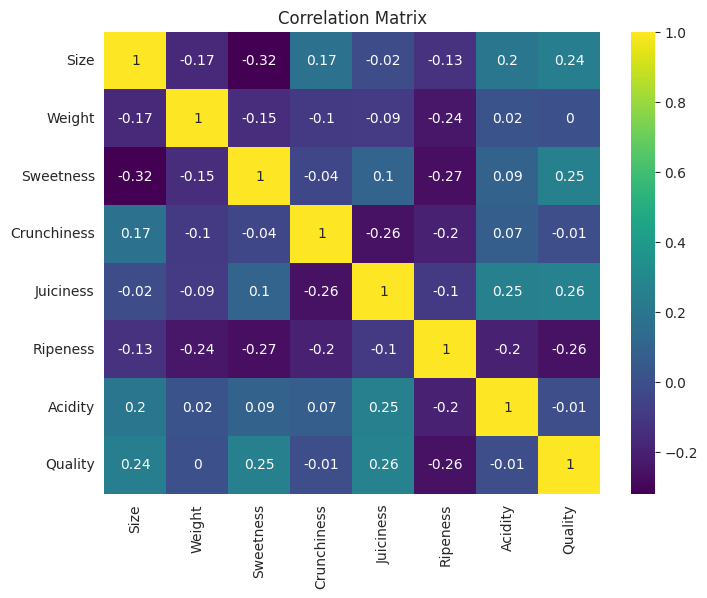

In [33]:
# Computing the correlation matrix
corr_matrix = np.round(np.corrcoef(data, rowvar=False), 2)

# Plotting the correlation matrix
plt.figure(figsize=(8,6))
sns.heatmap(corr_matrix, cmap='viridis', annot=True,
            xticklabels=data.columns, yticklabels=data.columns)

plt.title("Correlation Matrix");

In [34]:
# Separate our data set into independent variables (X) and target variable (y).
#=================================================================================
X = data.drop('Quality', axis = 1)
y = data['Quality']

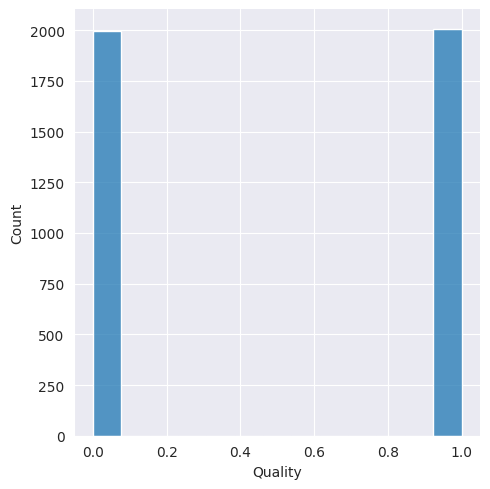

In [35]:
sns.displot(y)

<center><h1 style='background-color:#99ccff;padding:10px;font-family:courier'>📗 SCALE THE DATA Min-Max Scaling (Normalization)</h1></center>

Scaling data is an important preprocessing step in machine learning to bring all features to a similar numerical range. It helps in preventing features with larger scales from dominating the learning process and ensures that models can effectively learn from the data. T

In [36]:
from sklearn.preprocessing import MinMaxScaler

# Assuming 'X' is your DataFrame with numerical values
# Select the columns you want to scale (assuming all columns for this example)
columns_to_scale = X.columns

# Initialize the scaler
scaler = MinMaxScaler(feature_range=(0, 1))

# Fit and transform the selected columns
X[columns_to_scale] = scaler.fit_transform(X[columns_to_scale])

In [37]:
# from sklearn.preprocessing import StandardScaler, MinMaxScaler
# scaler = MinMaxScaler(feature_range = (0,1))

# anxiety.fit(anxiety) #scales the minimum and maximum values to be 0 and 1 respectively
# anxiety = scaler.transform(anxiety)

In [38]:
X.head()

,Size,Weight,Sweetness,Crunchiness,Juiciness,Ripeness,Acidity
0,0.234669,0.358370,0.922484,0.368781,0.585819,0.472770,0.452225
1,0.439331,0.333107,0.795706,0.558928,0.511408,0.513807,0.436185
2,0.505948,0.448092,0.388567,0.417732,0.660388,0.444693,0.668192
3,0.479014,0.376971,0.619422,0.435629,0.720370,0.187052,0.541180
4,0.628107,0.452317,0.490589,0.402347,0.674814,0.348084,0.521150


<center><h1 style='background-color:#99ccff;padding:10px;font-family:courier'>📗 SPLIT THE DATA IN TRAIN AND TEST</h1></center>

Now we divide into training and testing:

- train = 80%
- test = 20%

In [39]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold, cross_val_score, cross_validate
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import accuracy_score

In [40]:
from sklearn.model_selection import train_test_split
X_train, x_test, y_train, y_test = train_test_split(X, y, test_size=.2,random_state=42)

In [41]:
print(f'x_train: {X_train.shape}, y_train: {y_train.shape}')
print(f'x_test: {x_test.shape}, y_test: {y_test.shape}')

x_train: (3200, 7), y_train: (3200,)
x_test: (800, 7), y_test: (800,)



Accuracy	Balanced Accuracy	ROC AUC	F1 Score	Time Taken

Model					

LGBMClassifier	0.91	0.91	0.91	0.91	0.82

XGBClassifier	0.91	0.91	0.91	0.91	0.25

SVC	0.90	0.90	0.90	0.90	0.25

KNeighborsClassifier	0.90	0.90	0.90	0.90	0.09

ExtraTreesClassifier	0.90	0.90	0.90	0.90	0.52

LabelPropagation	0.90	0.90	0.90	0.90	0.64

LabelSpreading	0.90	0.90	0.90	0.90	0.90

RandomForestClassifier	0.90	0.90	0.90	0.90	0.93

NuSVC	0.88	0.88	0.88	0.88	0.40

BaggingClassifier	0.88	0.87	0.87	0.87	0.22

QuadraticDiscriminantAnalysis	0.85	0.85	0.85	0.85	0.04

DecisionTreeClassifier	0.81	0.81	0.81	0.81	0.04

<center><h1 style='background-color:#99ccff;padding:10px;font-family:courier'>📗 ANN</h1></center>
Now we are going to use a simple ANN. (Multilayer perceptron)

In [42]:
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

Decided to make the model less complex. As we have 7 input features, I have decided to put units as a multiple of 7. Only 1 input layer and one hidden layer.

In [43]:
BATCH_SIZE = 32
EPOCHS = 500

In [44]:
y_train_enc = pd.get_dummies(y_train)
y_test_enc = pd.get_dummies(y_test)
y_train_enc.head(10)

,0,1
3994,False,True
423,False,True
2991,True,False
1221,True,False
506,False,True
3860,True,False
3563,False,True
1123,False,True
2512,False,True
500,False,True


In [45]:
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation

# Assuming y_train is your original labels
y_train_enc = to_categorical(y_train, num_classes=2)

# Rest of your code remains the same
ann = Sequential()
ann.add(Dense(units=32, input_dim=X_train.shape[1]))
ann.add(Activation('relu'))
ann.add(Dense(units=16))
ann.add(Activation('relu'))
ann.add(Dense(units=y_train_enc.shape[1]))
ann.add(Activation('softmax'))
ann.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
ann.summary()

history = ann.fit(X_train, y_train_enc, batch_size=BATCH_SIZE, epochs=EPOCHS,validation_split=0.3)

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 32)                256       
                                                                 
 activation (Activation)     (None, 32)                0         
                                                                 
 dense_1 (Dense)             (None, 16)                528       
                                                                 
 activation_1 (Activation)   (None, 16)                0         
                                                                 
 dense_2 (Dense)             (None, 2)                 34        
                                                                 
 activation_2 (Activation)   (None, 2)                 0         
                                                                 
Total params: 818 (3.20 KB)
Trainable params: 818 (3.20 

In [46]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

train_loss = history.history['loss']
val_loss = history.history['val_loss']

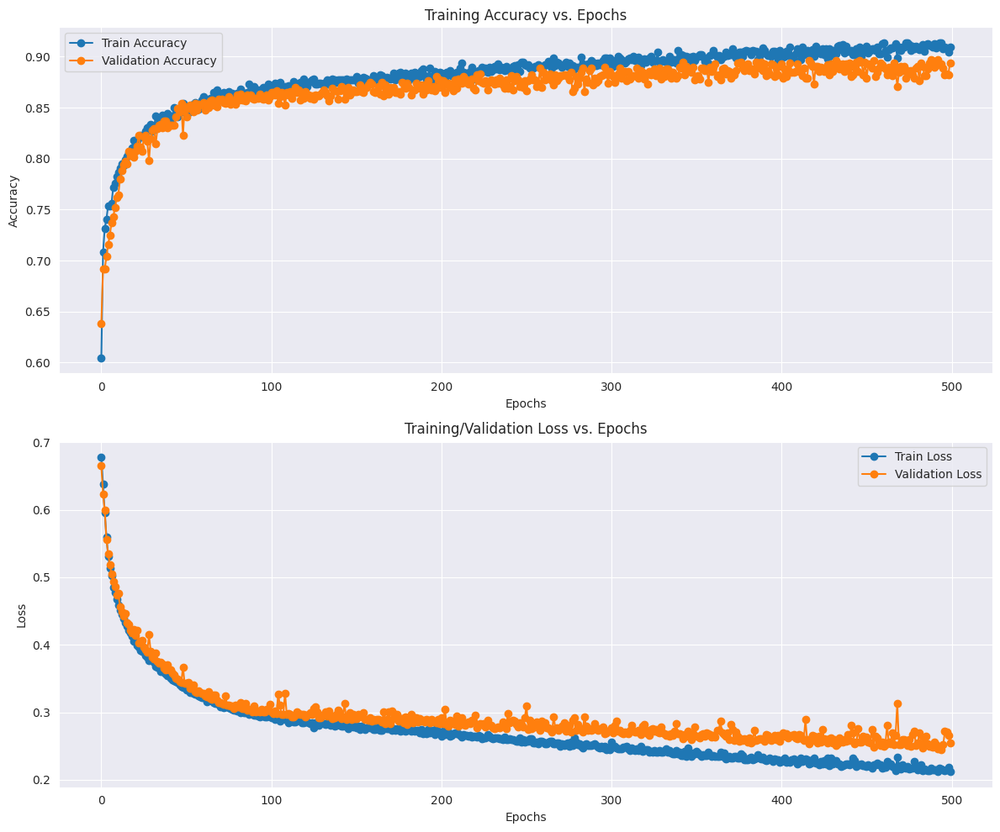

In [47]:
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

ax[0].set_title('Training Accuracy vs. Epochs')
ax[0].plot(train_accuracy, 'o-', label='Train Accuracy')
ax[0].plot(val_accuracy, 'o-', label='Validation Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend(loc='best')

ax[1].set_title('Training/Validation Loss vs. Epochs')
ax[1].plot(train_loss, 'o-', label='Train Loss')
ax[1].plot(val_loss, 'o-', label='Validation Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend(loc='best')

plt.tight_layout()
plt.show()

In [48]:
# Let us do the prediction now
y_pred = ann.predict(x_test)
y_pred = (y_pred > 0.5)

25/25 [==============================] - 0s 1ms/step


In [49]:
from sklearn.metrics import classification_report, accuracy_score, multilabel_confusion_matrix

# Assuming y_test_enc is your one-hot encoded labels
y_pred = ann.predict(x_test)

# Convert probabilities to class labels
y_pred_labels = np.argmax(y_pred, axis=1)
y_test_labels = np.argmax(y_test_enc, axis=1)

# Confusion Matrix
cm = confusion_matrix(y_test_labels, y_pred_labels)
print(cm)

# Classification Report
print(classification_report(y_test_labels, y_pred_labels))

# Accuracy Score
accuracy = accuracy_score(y_test_labels, y_pred_labels)
print("Accuracy:", accuracy)

25/25 [==============================] - 0s 1ms/step
[[365  36]
 [ 53 346]]
              precision    recall  f1-score   support

           0       0.87      0.91      0.89       401
           1       0.91      0.87      0.89       399

    accuracy                           0.89       800
   macro avg       0.89      0.89      0.89       800
weighted avg       0.89      0.89      0.89       800

Accuracy: 0.88875


In [50]:
print('The accuracy of ANN is: ' , 100.0 * accuracy_score(y_test_labels, y_pred_labels))
print('precision: ', 100.0*precision_score(y_test_labels, y_pred_labels,pos_label='positive'
                                           ,average='weighted'))
print('recall: ',100.0* recall_score(y_test_labels, y_pred_labels,pos_label='positive'
                                           ,average='weighted'))
print('f1-score: ',100.0*f1_score(y_test_labels, y_pred_labels,pos_label='positive'
                                           ,average='weighted'))

#  average has to be one of (None, 'weighted', 'macro', 'weighted', 'samples')


The accuracy of ANN is:  88.875
precision:  88.94417601893835
recall:  88.875
f1-score:  88.86938218276248


As we see we have a good accuracy as per Deep learning standard. Let us try to make the model little more complex.

In [51]:
for i in range(1,5):
    for j in range (1,i):
        print(i,j)

2 1
3 1
3 2
4 1
4 2
4 3


In [52]:
# import matplotlib.pyplot as plt
# import numpy as np
# from sklearn.metrics import classification_report, accuracy_score, confusion_matrix, precision_score, recall_score, f1_score
# from tensorflow.keras.models import Sequential
# from tensorflow.keras.layers import Dense, Activation
# from tensorflow.keras.utils import to_categorical
# from sklearn.model_selection import GridSearchCV


# # Assuming y_train is your original labels
# y_train_enc = to_categorical(y_train, num_classes=2)

# for i in range(1, 5):
#     ann = Sequential()
#     ann.add(Dense(units=32, input_dim=X_train.shape[1], activation='relu'))
    
#     for j in range(1, i):
#         ann.add(Dense(units=16*j, activation='relu'))
#         ann.add(Dense(units=7 * j, activation='relu'))
    
#     ann.add(Dense(units=y_train_enc.shape[1], activation='softmax'))
#     ann.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
#     ann.summary()

#     history = ann.fit(X_train, y_train_enc, batch_size=BATCH_SIZE, epochs=EPOCHS, validation_split=0.3)

#     train_accuracy = history.history['accuracy']
#     val_accuracy = history.history['val_accuracy']

#     train_loss = history.history['loss']
#     val_loss = history.history['val_loss']

#     fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

#     ax[0].set_title('Training Accuracy vs. Epochs')
#     ax[0].plot(train_accuracy, 'o-', label='Train Accuracy')
#     ax[0].plot(val_accuracy, 'o-', label='Validation Accuracy')
#     ax[0].set_xlabel('Epochs')
#     ax[0].set_ylabel('Accuracy')
#     ax[0].legend(loc='best')

#     ax[1].set_title('Training/Validation Loss vs. Epochs')
#     ax[1].plot(train_loss, 'o-', label='Train Loss')
#     ax[1].plot(val_loss, 'o-', label='Validation Loss')
#     ax[1].set_xlabel('Epochs')
#     ax[1].set_ylabel('Loss')
#     ax[1].legend(loc='best')

#     plt.tight_layout()
#     plt.show()

#     # Let us do the prediction now
#     y_pred = ann.predict(x_test)
#     y_pred_labels = np.argmax(y_pred, axis=1)

#     # Confusion Matrix
#     cm = confusion_matrix(y_test, y_pred_labels)
#     print(cm)

#     # Classification Report
#     print(classification_report(y_test, y_pred_labels))

#     # Accuracy Score
#     accuracy = accuracy_score(y_test, y_pred_labels)
#     print("Accuracy:", accuracy)

#     print('The accuracy of ANN is: ', 100.0 * accuracy_score(y_test, y_pred_labels))
#     print('precision: ', 100.0 * precision_score(y_test, y_pred_labels, pos_label='positive', average='weighted'))
#     print('recall: ', 100.0 * recall_score(y_test, y_pred_labels, pos_label='positive', average='weighted'))
#     print('f1-score: ', 100.0 * f1_score(y_test, y_pred_labels, pos_label='positive', average='weighted'))
#     print('\n ____________________________________\n ')

 <div style="color:#FFFFFF          ; display  :fill; border-radius:90px;
           background-color:#13A4B4; font-size:10px; font-family  :cursive">
    
<p style="padding   : .1px;    color    :#FFFFFF; 
          text-align: Left;   font-size:28px; font-family  :cursive">       
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&nbsp;RandomForestClassifier<a id=5></a></p>
</div>

In [53]:
from sklearn.ensemble import RandomForestClassifier

rnd_clf = RandomForestClassifier(n_estimators=100,max_depth=3, n_jobs=-1, random_state=42)

In [54]:
# Define the hyperparameter grid for RandomForestClassifier
param_grid_rf = {
    'n_estimators': [10, 50, 100],
    'criterion': ['gini', 'entropy'],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2'],
    'bootstrap': [True, False]
}

In [55]:
from sklearn.model_selection import GridSearchCV


grid_search_rf = GridSearchCV(
    rnd_clf, param_grid=param_grid_rf, cv=10, verbose=1, n_jobs=-1
)

In [56]:
grid_search_rf.fit(X_train, y_train)

Fitting 10 folds for each of 1296 candidates, totalling 12960 fits


/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


GridSearchCV(cv=10,
             estimator=RandomForestClassifier(max_depth=3, n_jobs=-1,
                                              random_state=42),
             n_jobs=-1,
             param_grid={'bootstrap': [True, False],
                         'criterion': ['gini', 'entropy'],
                         'max_depth': [None, 10, 20, 30],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_leaf': [1, 2, 4],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [10, 50, 100]},
             verbose=1)

In [57]:
grid_search_rf.best_params_

{'bootstrap': True,
 'criterion': 'entropy',
 'max_depth': 20,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 5,
 'n_estimators': 100}

In [58]:
rnd_clf = grid_search_rf.best_estimator_
rnd_clf

RandomForestClassifier(criterion='entropy', max_depth=20, max_features='auto',
                       min_samples_leaf=2, min_samples_split=5, n_jobs=-1,
                       random_state=42)

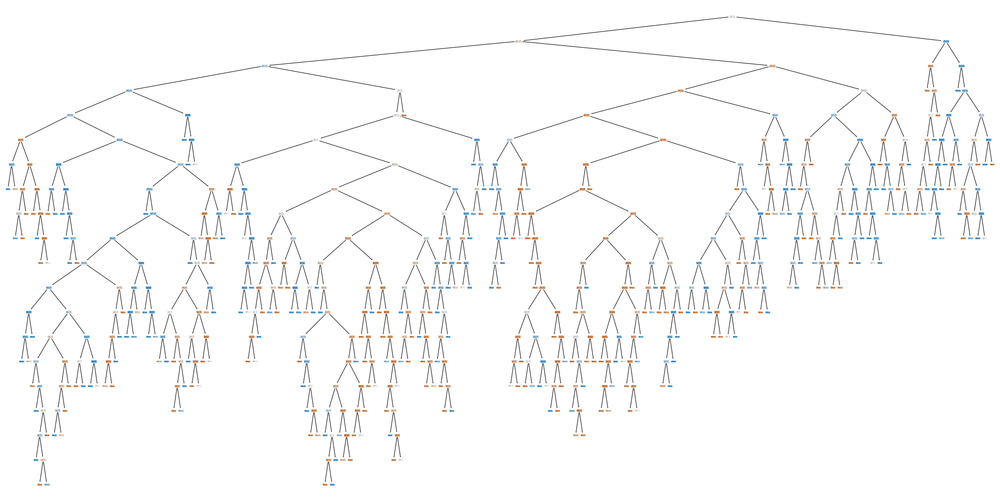

In [59]:
from sklearn import tree
plt.figure(figsize=(30,15))
for i in range(len(rnd_clf)):
    tree.plot_tree(rnd_clf[i],filled=True)

In [60]:
grid_search_rf.best_score_

0.87625

In [61]:
print ("Traning Accuracy: ",rnd_clf.score(X_train, y_train)*100) # Check training accuracy
print ("Testing Accuracy: ", rnd_clf.score(x_test, y_test)*100) # Check testing accuracy

Traning Accuracy:  99.46875
Testing Accuracy:  90.375


In [62]:
rnd_clf_pred=  rnd_clf.predict(x_test)
accuracy_score(rnd_clf_pred,y_test)*100

90.375

 <div style="color:#FFFFFF          ; display  :fill; border-radius:90px;
           background-color:#13A4B4; font-size:10px; font-family  :cursive">
    
<p style="padding   : .1px;    color    :#FFFFFF; 
          text-align: Left;   font-size:28px; font-family  :cursive">       
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&nbsp;classification_report<a id=5></a></p>
</div>

In [63]:
print(classification_report(y_test,rnd_clf_pred)) #main

              precision    recall  f1-score   support

           0       0.91      0.90      0.90       401
           1       0.90      0.91      0.90       399

    accuracy                           0.90       800
   macro avg       0.90      0.90      0.90       800
weighted avg       0.90      0.90      0.90       800



In [64]:
print('The accuracy of RF Classifier is: ' , 100.0 * accuracy_score(y_test,rnd_clf_pred))
print('precision: ', 100.0*precision_score(y_test, rnd_clf_pred,pos_label='positive'
                                           ,average='weighted'))
print('recall: ',100.0* recall_score(y_test, rnd_clf_pred,pos_label='positive'
                                           ,average='weighted'))
print('f1-score: ',100.0*f1_score(y_test, rnd_clf_pred,pos_label='positive'
                                           ,average='weighted'))

The accuracy of RF Classifier is:  90.375
precision:  90.37745162379059
recall:  90.375
f1-score:  90.374954882742


 <div style="color:#FFFFFF          ; display  :fill; border-radius:90px;
           background-color:#13A4B4; font-size:10px; font-family  :cursive">
    
<p style="padding   : .1px;    color    :#FFFFFF; 
          text-align: Left;   font-size:28px; font-family  :cursive">       
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&nbsp;CONFUSION MATRIX<a id=5></a></p>
</div>

In [65]:
cm=confusion_matrix(y_test,rnd_clf_pred)
cm

array([[361,  40],
       [ 37, 362]])

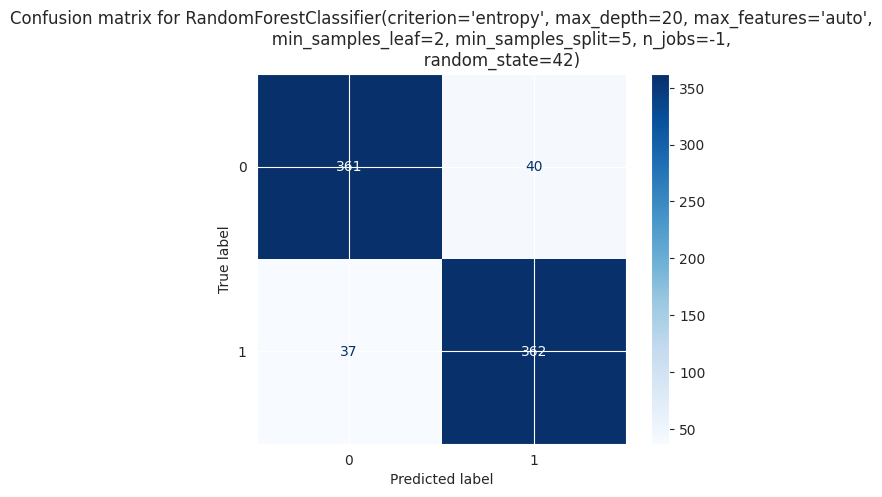

In [66]:
from sklearn.metrics import ConfusionMatrixDisplay


disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues', values_format='d', xticks_rotation='horizontal')
plt.title(f'Confusion matrix for {rnd_clf}')
plt.show()

## Finding an appropiate n_neighbors value for kNN classifier by uniform and distance weight function:

 <div style="color:#FFFFFF          ; display  :fill; border-radius:90px;
           background-color:#13A4B4; font-size:10px; font-family  :cursive">
    
<p style="padding   : .1px;    color    :#FFFFFF; 
          text-align: Left;   font-size:28px; font-family  :cursive">       
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&nbsp;KNeighborsClassifie<a id=5></a></p>
</div>


In [67]:
kneighbors_lassifier = KNeighborsClassifier()

In [68]:
# Define the hyperparameter grid for KNeighborsClassifier
param_grid_knn = {
    'n_neighbors': range(1, 100),
    'weights': ['uniform', 'distance'],
    'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
    'p': [1, 2],
    'metric' : ['minkowski','euclidean','manhattan']
}

In [69]:
grid_search_knn = GridSearchCV(
    kneighbors_lassifier, param_grid=param_grid_knn, cv=10, verbose=1, n_jobs=-1
)

In [70]:
grid_search_knn.fit(X_train, y_train)

Fitting 10 folds for each of 4752 candidates, totalling 47520 fits


GridSearchCV(cv=10, estimator=KNeighborsClassifier(), n_jobs=-1,
             param_grid={'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                         'metric': ['minkowski', 'euclidean', 'manhattan'],
                         'n_neighbors': range(1, 100), 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             verbose=1)

In [71]:
grid_search_knn.best_params_

{'algorithm': 'auto',
 'metric': 'minkowski',
 'n_neighbors': 8,
 'p': 2,
 'weights': 'distance'}

In [72]:
kneighbors_lassifier = grid_search_knn.best_estimator_
kneighbors_lassifier

KNeighborsClassifier(n_neighbors=8, weights='distance')

In [73]:
grid_search_knn.best_score_

0.900625

In [74]:
print ("Traning Accuracy: ", kneighbors_lassifier.score(X_train, y_train)*100) # Check training accuracy
print ("Testing Accuracy: ", kneighbors_lassifier.score(x_test,y_test)*100) # Check testing accuracy

Traning Accuracy:  100.0
Testing Accuracy:  90.625


In [75]:
kneighbors_lassifier_pred = kneighbors_lassifier.predict(x_test)
accuracy_score(kneighbors_lassifier_pred,y_test)*100

90.625

 <div style="color:#FFFFFF          ; display  :fill; border-radius:90px;
           background-color:#13A4B4; font-size:10px; font-family  :cursive">
    
<p style="padding   : .1px;    color    :#FFFFFF; 
          text-align: Left;   font-size:28px; font-family  :cursive">       
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&nbsp;classification_report<a id=5></a></p>
</div>

In [76]:
print(classification_report(y_test,kneighbors_lassifier_pred)) #main

              precision    recall  f1-score   support

           0       0.91      0.90      0.91       401
           1       0.90      0.91      0.91       399

    accuracy                           0.91       800
   macro avg       0.91      0.91      0.91       800
weighted avg       0.91      0.91      0.91       800



In [77]:
print('The accuracy of KNeighborsClassifier is: ' , 100.0 * accuracy_score(y_test,kneighbors_lassifier_pred))
print('precision: ', 100.0*precision_score(y_test, kneighbors_lassifier_pred,pos_label='positive'
                                           ,average='weighted'))
print('recall: ',100.0* recall_score(y_test, kneighbors_lassifier_pred,pos_label='positive'
                                           ,average='weighted'))
print('f1-score: ',100.0*f1_score(y_test, kneighbors_lassifier_pred,pos_label='positive'
                                           ,average='weighted'))

The accuracy of KNeighborsClassifier is:  90.625
precision:  90.63785445475231
recall:  90.625
f1-score:  90.62448728465955


 <div style="color:#FFFFFF          ; display  :fill; border-radius:90px;
           background-color:#13A4B4; font-size:10px; font-family  :cursive">
    
<p style="padding   : .1px;    color    :#FFFFFF; 
          text-align: Left;   font-size:28px; font-family  :cursive">       
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&nbsp;CONFUSION MATRIX<a id=5></a></p>
</div>

In [78]:
cm=confusion_matrix(y_test,kneighbors_lassifier_pred)
cm

array([[360,  41],
       [ 34, 365]])

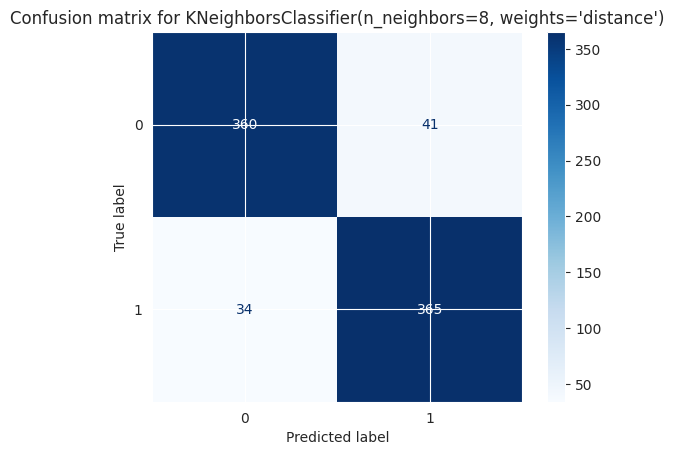

In [79]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues', values_format='d', xticks_rotation='horizontal')
plt.title(f'Confusion matrix for {kneighbors_lassifier}')
plt.show()

 <div style="color:#FFFFFF          ; display  :fill; border-radius:90px;
           background-color:#13A4B4; font-size:10px; font-family  :cursive">
    
<p style="padding   : .1px;    color    :#FFFFFF; 
          text-align: Left;   font-size:28px; font-family  :cursive">       
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&nbsp;Support Vector Classification<a id=5></a></p>
</div>

In [80]:
from sklearn.svm import SVC
svc = SVC(gamma='auto',probability=True)

In [81]:
# Define the hyperparameter grid for SVC
param_grid_svc = {
     'C': [0.1, 1, 10, 100],
    'kernel': ['linear', 'rbf', 'poly'],
    'gamma': ['scale', 'auto', 0.1, 1],
    'degree': [2],  # only relevant for 'poly' kernel
    'coef0': [1]  # relevant for 'poly' and 'sigmoid'
}

In [82]:
grid_search_svc = GridSearchCV(
    svc, param_grid=param_grid_svc, cv=5, verbose=1, n_jobs=-1
)

In [83]:
grid_search_svc.fit(X_train, y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


GridSearchCV(cv=5, estimator=SVC(gamma='auto', probability=True), n_jobs=-1,
             param_grid={'C': [0.1, 1, 10, 100], 'coef0': [1], 'degree': [2],
                         'gamma': ['scale', 'auto', 0.1, 1],
                         'kernel': ['linear', 'rbf', 'poly']},
             verbose=1)

In [84]:
grid_search_svc.best_params_

{'C': 100, 'coef0': 1, 'degree': 2, 'gamma': 'scale', 'kernel': 'rbf'}

In [85]:
svc = grid_search_svc.best_estimator_
svc

SVC(C=100, coef0=1, degree=2, probability=True)

In [86]:
grid_search_svc.best_score_

0.9053125

In [87]:
print ("Traning Accuracy: ", svc.score(X_train, y_train)*100) # Check training accuracy
print ("Testing Accuracy: ", svc.score(x_test,y_test)*100) # Check testing accuracy

Traning Accuracy:  96.125
Testing Accuracy:  92.0


In [88]:
svc_pred = svc.predict(x_test)
accuracy_score(svc_pred,y_test)*100

92.0

 <div style="color:#FFFFFF          ; display  :fill; border-radius:90px;
           background-color:#13A4B4; font-size:10px; font-family  :cursive">
    
<p style="padding   : .1px;    color    :#FFFFFF; 
          text-align: Left;   font-size:28px; font-family  :cursive">       
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&nbsp;classification_report<a id=5></a></p>
</div>

In [89]:
print(classification_report(y_test,svc_pred)) #main

              precision    recall  f1-score   support

           0       0.91      0.94      0.92       401
           1       0.94      0.90      0.92       399

    accuracy                           0.92       800
   macro avg       0.92      0.92      0.92       800
weighted avg       0.92      0.92      0.92       800



In [90]:
print('The accuracy of SVC Classifier is: ' , 100.0 * accuracy_score(y_test,svc_pred))
print('precision: ', 100.0*precision_score(y_test, svc_pred,pos_label='positive'
                                           ,average='weighted'))
print('recall: ',100.0* recall_score(y_test, svc_pred,pos_label='positive'
                                           ,average='weighted'))
print('f1-score: ',100.0*f1_score(y_test, svc_pred,pos_label='positive'
                                           ,average='weighted'))

The accuracy of SVC Classifier is:  92.0
precision:  92.05082146768893
recall:  92.0
f1-score:  91.99719887955183


 <div style="color:#FFFFFF          ; display  :fill; border-radius:90px;
           background-color:#13A4B4; font-size:10px; font-family  :cursive">
    
<p style="padding   : .1px;    color    :#FFFFFF; 
          text-align: Left;   font-size:28px; font-family  :cursive">       
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&nbsp;CONFUSION MATRIX<a id=5></a></p>
</div>

In [91]:
cm=confusion_matrix(y_test,svc_pred)
cm

array([[376,  25],
       [ 39, 360]])

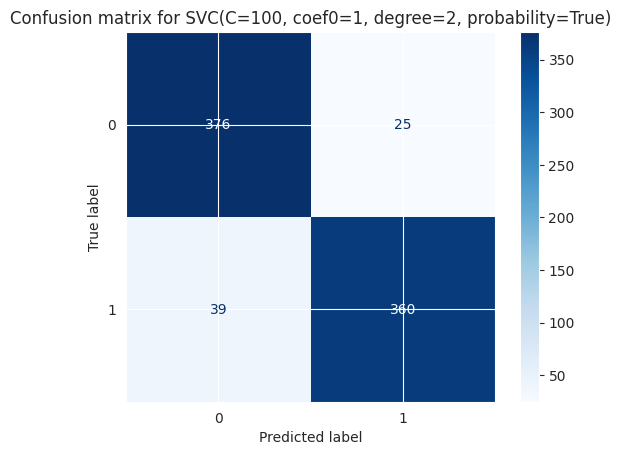

In [92]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues', values_format='d', xticks_rotation='horizontal')
plt.title(f'Confusion matrix for {svc}')
plt.show()

<center><h1 style='background-color:#99ccff;padding:10px;font-family:courier'>📗 LGBMClassifier</h1></center>

Fitting 10 folds for each of 2916 candidates, totalling 29160 fits


/opt/conda/lib/python3.10/site-packages/dask/dataframe/_pyarrow_compat.py:23: UserWarning: You are using pyarrow version 11.0.0 which is known to be insecure. See https://www.cve.org/CVERecord?id=CVE-2023-47248 for further details. Please upgrade to pyarrow>=14.0.1 or install pyarrow-hotfix to patch your current version.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/dask/dataframe/_pyarrow_compat.py:23: UserWarning: You are using pyarrow version 11.0.0 which is known to be insecure. See https://www.cve.org/CVERecord?id=CVE-2023-47248 for further details. Please upgrade to pyarrow>=14.0.1 or install pyarrow-hotfix to patch your current version.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/dask/dataframe/_pyarrow_compat.py:23: UserWarning: You are using pyarrow version 11.0.0 which is known to be insecure. See https://www.cve.org/CVERecord?id=CVE-2023-47248 for further details. Please upgrade to pyarrow>=14.0.1 or install pyarrow-hotfix to patch your current versio

Best Parameters for LGBM:  {'colsample_bytree': 1.0, 'learning_rate': 0.2, 'max_depth': 7, 'min_child_samples': 20, 'n_estimators': 100, 'reg_alpha': 0.0, 'reg_lambda': 0.0, 'subsample': 0.8}
Best LGBM Estimator:  LGBMClassifier(learning_rate=0.2, max_depth=7, random_state=42, subsample=0.8)
Best Score for LGBM:  0.8915624999999998
Training Accuracy (LGBM):  99.96875
Testing Accuracy (LGBM):  90.75
Accuracy (LGBM): 90.75
              precision    recall  f1-score   support

           0       0.91      0.91      0.91       401
           1       0.91      0.91      0.91       399

    accuracy                           0.91       800
   macro avg       0.91      0.91      0.91       800
weighted avg       0.91      0.91      0.91       800

The accuracy of LGBM Classifier is:  90.75
Precision:  90.75
Recall:  90.75
F1-score:  90.75


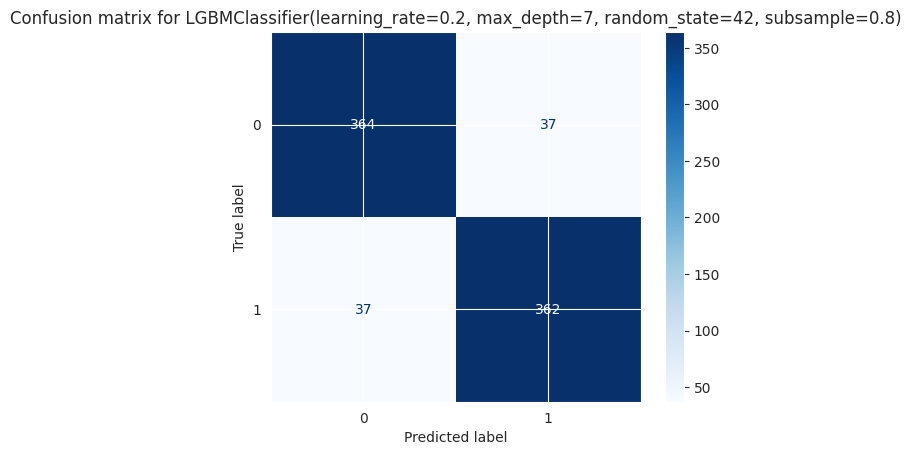

In [93]:
from lightgbm import LGBMClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Instantiate the LGBMClassifier
lgbm_clf = LGBMClassifier(n_estimators=100, max_depth=3, random_state=42)

# Define the hyperparameter grid for LGBMClassifier
param_grid_lgbm = {
    'n_estimators': [10, 50, 100],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_child_samples': [5, 10, 20],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'reg_alpha': [0.0, 0.1, 0.5],
    'reg_lambda': [0.0, 0.1, 0.5]
}

# Perform GridSearchCV
grid_search_lgbm = GridSearchCV(
    lgbm_clf, param_grid=param_grid_lgbm, cv=10, verbose=1, n_jobs=-1
)

grid_search_lgbm.fit(X_train, y_train)

# Get the best parameters
best_params_lgbm = grid_search_lgbm.best_params_
print("Best Parameters for LGBM: ", best_params_lgbm)

# Get the best estimator
lgbm_clf = grid_search_lgbm.best_estimator_
print("Best LGBM Estimator: ", lgbm_clf)

# Get the best score
best_score_lgbm = grid_search_lgbm.best_score_
print("Best Score for LGBM: ", best_score_lgbm)

# Check training accuracy
print("Training Accuracy (LGBM): ", lgbm_clf.score(X_train, y_train) * 100)

# Check testing accuracy
print("Testing Accuracy (LGBM): ", lgbm_clf.score(x_test, y_test) * 100)

# Make predictions on the test set
lgbm_pred = lgbm_clf.predict(x_test)

# Accuracy Score
accuracy_lgbm = accuracy_score(lgbm_pred, y_test) * 100
print("Accuracy (LGBM):", accuracy_lgbm)

# Classification Report
print(classification_report(y_test, lgbm_pred))

# Additional Metrics
print('The accuracy of LGBM Classifier is: ', accuracy_lgbm)
print('Precision: ', 100.0 * precision_score(y_test, lgbm_pred, pos_label='positive', average='weighted'))
print('Recall: ', 100.0 * recall_score(y_test, lgbm_pred, pos_label='positive', average='weighted'))
print('F1-score: ', 100.0 * f1_score(y_test, lgbm_pred, pos_label='positive', average='weighted'))

# Confusion Matrix
cm_lgbm = confusion_matrix(y_test, lgbm_pred)

# Plot Confusion Matrix
disp_lgbm = ConfusionMatrixDisplay(confusion_matrix=cm_lgbm)
disp_lgbm.plot(cmap='Blues', values_format='d', xticks_rotation='horizontal')
plt.title(f'Confusion matrix for {lgbm_clf}')
plt.show()

<center><h1 style='background-color:#99ccff;padding:10px;font-family:courier'>📗 XGBoost</h1></center>

Fitting 10 folds for each of 2916 candidates, totalling 29160 fits
Best Parameters for XGBoost:  {'colsample_bytree': 1.0, 'learning_rate': 0.2, 'max_depth': 7, 'min_child_weight': 3, 'n_estimators': 100, 'reg_alpha': 0.5, 'reg_lambda': 0.5, 'subsample': 1.0}
Best XGBoost Estimator:  XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=1.0, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.2, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=7, max_leaves=None,
              min_child_weight=3, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=100, n_jobs=None,
              num_parallel_t

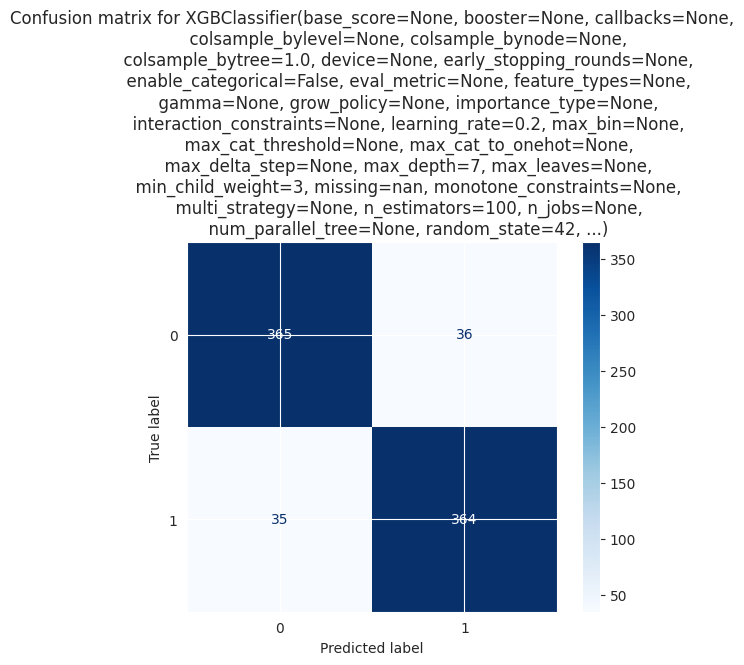

In [94]:
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, precision_score, recall_score, f1_score
from sklearn.metrics import ConfusionMatrixDisplay
import matplotlib.pyplot as plt

# Instantiate the XGBClassifier
xgb_clf = XGBClassifier(n_estimators=100, max_depth=3, random_state=42)

# Define the hyperparameter grid for XGBClassifier
param_grid_xgb = {
    'n_estimators': [10, 50, 100],
    'learning_rate': [0.01, 0.1, 0.2],
    'max_depth': [3, 5, 7],
    'min_child_weight': [1, 3, 5],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'reg_alpha': [0.0, 0.1, 0.5],
    'reg_lambda': [0.0, 0.1, 0.5]
}

# Perform GridSearchCV
grid_search_xgb = GridSearchCV(
    xgb_clf, param_grid=param_grid_xgb, cv=10, verbose=1, n_jobs=-1
)

grid_search_xgb.fit(X_train, y_train)

# Get the best parameters
best_params_xgb = grid_search_xgb.best_params_
print("Best Parameters for XGBoost: ", best_params_xgb)

# Get the best estimator
xgb_clf = grid_search_xgb.best_estimator_
print("Best XGBoost Estimator: ", xgb_clf)

# Get the best score
best_score_xgb = grid_search_xgb.best_score_
print("Best Score for XGBoost: ", best_score_xgb)

# Check training accuracy
print("Training Accuracy (XGBoost): ", xgb_clf.score(X_train, y_train) * 100)

# Check testing accuracy
print("Testing Accuracy (XGBoost): ", xgb_clf.score(x_test, y_test) * 100)

# Make predictions on the test set
xgb_pred = xgb_clf.predict(x_test)

# Accuracy Score
accuracy_xgb = accuracy_score(xgb_pred, y_test) * 100
print("Accuracy (XGBoost):", accuracy_xgb)

# Classification Report
print(classification_report(y_test, xgb_pred))

# Additional Metrics
print('The accuracy of XGBoost Classifier is: ', accuracy_xgb)
print('Precision: ', 100.0 * precision_score(y_test, xgb_pred, pos_label='positive', average='weighted'))
print('Recall: ', 100.0 * recall_score(y_test, xgb_pred, pos_label='positive', average='weighted'))
print('F1-score: ', 100.0 * f1_score(y_test, xgb_pred, pos_label='positive', average='weighted'))

# Confusion Matrix
cm_xgb = confusion_matrix(y_test, xgb_pred)

# Plot Confusion Matrix
disp_xgb = ConfusionMatrixDisplay(confusion_matrix=cm_xgb)
disp_xgb.plot(cmap='Blues', values_format='d', xticks_rotation='horizontal')
plt.title(f'Confusion matrix for {xgb_clf}')
plt.show()

# Voting

In [95]:
from sklearn.ensemble import VotingClassifier

voting  = VotingClassifier(estimators=[('SVC', svc), ('RF', rnd_clf), ('XGB', xgb_clf)], voting='soft')

In [96]:
voting.fit(X_train, y_train)

VotingClassifier(estimators=[('SVC',
                              SVC(C=100, coef0=1, degree=2, probability=True)),
                             ('RF',
                              RandomForestClassifier(criterion='entropy',
                                                     max_depth=20,
                                                     max_features='auto',
                                                     min_samples_leaf=2,
                                                     min_samples_split=5,
                                                     n_jobs=-1,
                                                     random_state=42)),
                             ('XGB',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample...
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=0.2, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=7,
                                            max_leaves=None, min_child_weight=3,
                                            missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=42, ...))],
                 voting='soft')

In [97]:
print ("Traning Accuracy: ", voting.score(X_train, y_train)*100) # Check training accuracy
print ("Testing Accuracy: ", voting.score(x_test,y_test)*100) # Check testing accuracy

Traning Accuracy:  99.03125
Testing Accuracy:  92.5


In [98]:
voting_pred = voting.predict(x_test)
accuracy_score(voting_pred,y_test)*100

92.5

 <div style="color:#FFFFFF          ; display  :fill; border-radius:90px;
           background-color:#13A4B4; font-size:10px; font-family  :cursive">
    
<p style="padding   : .1px;    color    :#FFFFFF; 
          text-align: Left;   font-size:28px; font-family  :cursive">       
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&nbsp;classification_report<a id=5></a></p>
</div>

In [99]:
print(classification_report(y_test,voting_pred)) #main

              precision    recall  f1-score   support

           0       0.93      0.93      0.93       401
           1       0.92      0.92      0.92       399

    accuracy                           0.93       800
   macro avg       0.92      0.92      0.92       800
weighted avg       0.93      0.93      0.93       800



In [100]:
print('The accuracy of Voting Classifier is: ' , 100.0 * accuracy_score(y_test,voting_pred))
print('precision: ', 100.0*precision_score(y_test, voting_pred,pos_label='positive'
                                           ,average='weighted'))
print('recall: ',100.0* recall_score(y_test, voting_pred,pos_label='positive'
                                           ,average='weighted'))
print('f1-score: ',100.0*f1_score(y_test, voting_pred,pos_label='positive'
                                           ,average='weighted'))

The accuracy of Voting Classifier is:  92.5
precision:  92.5
recall:  92.5
f1-score:  92.5


 <div style="color:#FFFFFF          ; display  :fill; border-radius:90px;
           background-color:#13A4B4; font-size:10px; font-family  :cursive">
    
<p style="padding   : .1px;    color    :#FFFFFF; 
          text-align: Left;   font-size:28px; font-family  :cursive">       
&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&emsp;&nbsp;CONFUSION MATRIX<a id=5></a></p>
</div>

In [101]:
cm=confusion_matrix(y_test,voting_pred)
cm

array([[371,  30],
       [ 30, 369]])

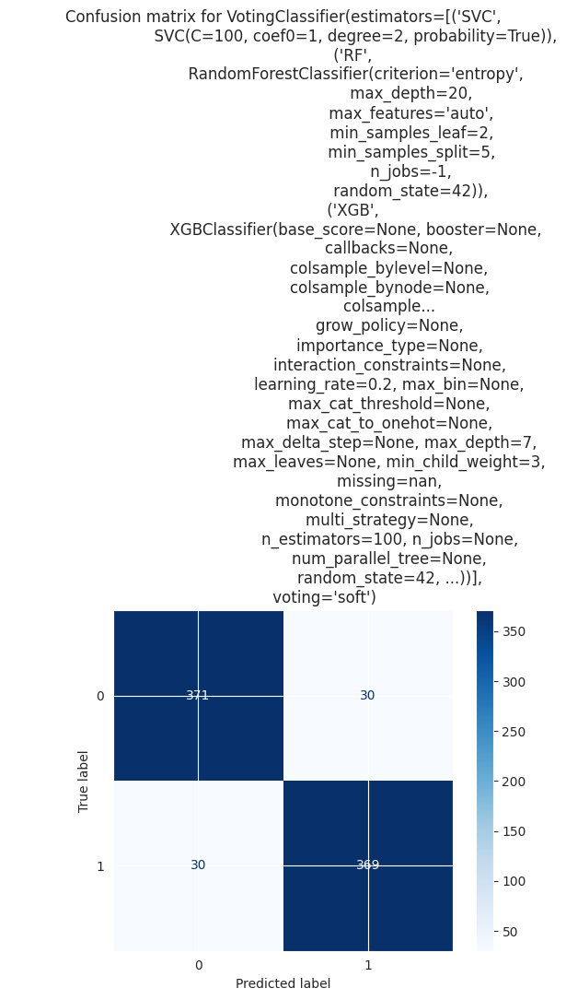

In [102]:
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap='Blues', values_format='d', xticks_rotation='horizontal')
plt.title(f'Confusion matrix for {voting}')
plt.show()

<center><h1 style='background-color:#99ccff;padding:10px;font-family:courier'>📗 Neural Network</h1></center>

In [103]:
from keras.models import Sequential
from keras.layers import Dense, Activation

In [104]:
y_train_enc = pd.get_dummies(y_train)
y_test_enc = pd.get_dummies(y_test)
y_train_enc.head(10)

,0,1
3994,False,True
423,False,True
2991,True,False
1221,True,False
506,False,True
3860,True,False
3563,False,True
1123,False,True
2512,False,True
500,False,True


In [105]:
model = Sequential()
model.add(Dense(32, input_dim=X_train.shape[1]))
model.add(Activation('relu'))
model.add(Dense(16))
model.add(Activation('relu'))
model.add(Dense(y_train_enc.shape[1]))
model.add(Activation('softmax'))
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 32)                256       
                                                                 
 activation_3 (Activation)   (None, 32)                0         
                                                                 
 dense_4 (Dense)             (None, 16)                528       
                                                                 
 activation_4 (Activation)   (None, 16)                0         
                                                                 
 dense_5 (Dense)             (None, 2)                 34        
                                                                 
 activation_5 (Activation)   (None, 2)                 0         
                                                                 
Total params: 818 (3.20 KB)
Trainable params: 818 (3.2

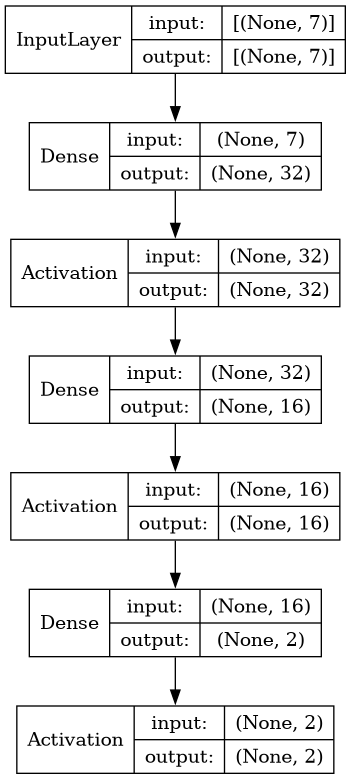

In [106]:
from tensorflow.keras.utils import plot_model
plot_model(model, expand_nested=True, show_shapes=True, show_layer_names=False)

In [107]:
model.compile(loss='binary_crossentropy',metrics=['accuracy'], optimizer='adam')

In [108]:
history = model.fit(X_train, y_train_enc, batch_size=32, epochs=500, validation_split=0.3)

Epoch 1/500
70/70 [==============================] - 1s 6ms/step - loss: 0.6840 - accuracy: 0.5580 - val_loss: 0.6738 - val_accuracy: 0.6865
Epoch 2/500
70/70 [==============================] - 0s 3ms/step - loss: 0.6558 - accuracy: 0.7018 - val_loss: 0.6451 - val_accuracy: 0.6948
Epoch 3/500
70/70 [==============================] - 0s 3ms/step - loss: 0.6209 - accuracy: 0.7152 - val_loss: 0.6104 - val_accuracy: 0.6740
Epoch 4/500
70/70 [==============================] - 0s 3ms/step - loss: 0.5845 - accuracy: 0.7219 - val_loss: 0.5831 - val_accuracy: 0.6885
Epoch 5/500
70/70 [==============================] - 0s 3ms/step - loss: 0.5589 - accuracy: 0.7308 - val_loss: 0.5658 - val_accuracy: 0.6896
Epoch 6/500
70/70 [==============================] - 0s 3ms/step - loss: 0.5471 - accuracy: 0.7277 - val_loss: 0.5557 - val_accuracy: 0.6917
Epoch 7/500
70/70 [==============================] - 0s 3ms/step - loss: 0.5338 - accuracy: 0.7371 - val_loss: 0.5469 - val_accuracy: 0.7042
Epoch 8/500
7

In [109]:
train_accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']

train_loss = history.history['loss']
val_loss = history.history['val_loss']

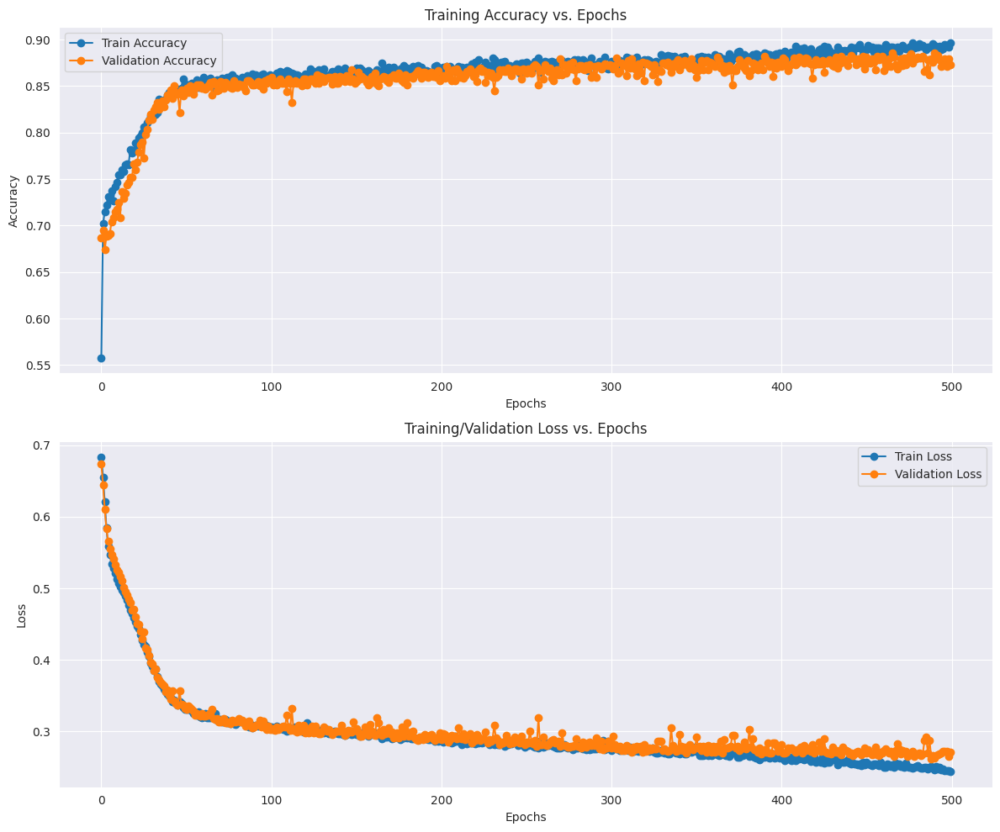

In [110]:
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(12, 10))

ax[0].set_title('Training Accuracy vs. Epochs')
ax[0].plot(train_accuracy, 'o-', label='Train Accuracy')
ax[0].plot(val_accuracy, 'o-', label='Validation Accuracy')
ax[0].set_xlabel('Epochs')
ax[0].set_ylabel('Accuracy')
ax[0].legend(loc='best')

ax[1].set_title('Training/Validation Loss vs. Epochs')
ax[1].plot(train_loss, 'o-', label='Train Loss')
ax[1].plot(val_loss, 'o-', label='Validation Loss')
ax[1].set_xlabel('Epochs')
ax[1].set_ylabel('Loss')
ax[1].legend(loc='best')

plt.tight_layout()
plt.show()

In [111]:

from sklearn.metrics import classification_report, accuracy_score, multilabel_confusion_matrix

# Assuming y_test_enc is your one-hot encoded labels
nn_pred = model.predict(x_test)

# Convert probabilities to class labels
nn_pred_labels = np.argmax(nn_pred, axis=1)
nn_test_labels = np.argmax(y_test_enc, axis=1)

# Confusion Matrix
cm = confusion_matrix(nn_test_labels, nn_pred_labels)
print(cm)

# Classification Report
print(classification_report(nn_test_labels, nn_pred_labels))

# Accuracy Score
accuracy = accuracy_score(nn_test_labels, nn_pred_labels)
print("Accuracy:", accuracy)

print('The accuracy of ANN is: ' , 100.0 * accuracy_score(nn_test_labels, nn_pred_labels))
print('precision: ', 100.0*precision_score(nn_test_labels, nn_pred_labels,pos_label='positive'
                                           ,average='weighted'))
print('recall: ',100.0* recall_score(nn_test_labels, nn_pred_labels,pos_label='positive'
                                           ,average='weighted'))
print('f1-score: ',100.0*f1_score(nn_test_labels, nn_pred_labels,pos_label='positive'
                                           ,average='weighted'))

#  average has to be one of (None, 'weighted', 'macro', 'weighted', 'samples')

25/25 [==============================] - 0s 1ms/step
[[356  45]
 [ 35 364]]
              precision    recall  f1-score   support

           0       0.91      0.89      0.90       401
           1       0.89      0.91      0.90       399

    accuracy                           0.90       800
   macro avg       0.90      0.90      0.90       800
weighted avg       0.90      0.90      0.90       800

Accuracy: 0.9
The accuracy of ANN is:  90.0
precision:  90.02563797922699
recall:  90.0
f1-score:  89.9987498749875


<center><h1 style='background-color:#99ccff;padding:10px;font-family:courier'>📗 DATAFRAMES PLOT</h1></center>

In [112]:
# Make dataframes to plot

rf_df = pd.DataFrame(data=[
    f1_score(y_test,rnd_clf_pred,pos_label='positive',average='weighted'),
    accuracy_score(y_test, rnd_clf_pred), 
    recall_score(y_test, rnd_clf_pred,pos_label='positive',average='weighted'),
    precision_score(y_test, rnd_clf_pred,pos_label='positive',average='weighted')], 
             columns=['RF Score'],
             index=["F1","Accuracy", "Recall", "Precision"])


knn_df = pd.DataFrame(data=[
    f1_score(y_test,kneighbors_lassifier_pred,pos_label='positive',average='weighted'),
    accuracy_score(y_test, kneighbors_lassifier_pred), 
    recall_score(y_test, kneighbors_lassifier_pred,pos_label='positive',average='weighted'),
    precision_score(y_test, kneighbors_lassifier_pred,pos_label='positive',average='weighted')], 
             columns=['KNN Score'],
             index=["F1","Accuracy", "Recall", "Precision"])

svc_df = pd.DataFrame(data=[
    f1_score(y_test,svc_pred,pos_label='positive',average='weighted'),
    accuracy_score(y_test, svc_pred), 
    recall_score(y_test, svc_pred,pos_label='positive',average='weighted'),
    precision_score(y_test, svc_pred,pos_label='positive',average='weighted')], 
             columns=['SVC Score'],
             index=["F1","Accuracy", "Recall", "Precision"])

voting_df = pd.DataFrame(data=[
    f1_score(y_test,voting_pred,pos_label='positive',average='weighted'),
    accuracy_score(y_test, voting_pred), 
    recall_score(y_test, voting_pred,pos_label='positive',average='weighted'),
    precision_score(y_test, voting_pred,pos_label='positive',average='weighted')], 
             columns=['Voting Score'],
             index=["F1","Accuracy", "Recall", "Precision"])


xgb_df = pd.DataFrame(data=[
    f1_score(y_test,xgb_pred,pos_label='positive',average='weighted'),
    accuracy_score(y_test, xgb_pred), 
    recall_score(y_test, xgb_pred,pos_label='positive',average='weighted'),
    precision_score(y_test, xgb_pred,pos_label='positive',average='weighted')], 
             columns=['XGB Score'],
             index=["F1","Accuracy", "Recall", "Precision"])

lgbm_df = pd.DataFrame(data=[
    f1_score(y_test,lgbm_pred,pos_label='positive',average='weighted'),
    accuracy_score(y_test, lgbm_pred), 
    recall_score(y_test, lgbm_pred,pos_label='positive',average='weighted'),
    precision_score(y_test, lgbm_pred,pos_label='positive',average='weighted')], 
             columns=['LGBM Score'],
             index=["F1","Accuracy", "Recall", "Precision"])


voting_df = pd.DataFrame(data=[
    f1_score(y_test,voting_pred,pos_label='positive',average='weighted'),
    accuracy_score(y_test, voting_pred), 
    recall_score(y_test, voting_pred,pos_label='positive',average='weighted'),
    precision_score(y_test, voting_pred,pos_label='positive',average='weighted')], 
             columns=['Voting Score'],
             index=["F1","Accuracy", "Recall", "Precision"])

ann_df = pd.DataFrame(data=[
    f1_score(y_test,y_pred_labels,pos_label='positive',average='weighted'),
    accuracy_score(y_test, y_pred_labels), 
    recall_score(y_test, y_pred_labels,pos_label='positive',average='weighted'),
    precision_score(y_test, y_pred_labels,pos_label='positive',average='weighted')], 
             columns=['ANN Score'],
             index=["F1","Accuracy", "Recall", "Precision"])

nn_df = pd.DataFrame(data=[
    f1_score(y_test,nn_pred_labels,pos_label='positive',average='weighted'),
    accuracy_score(y_test, nn_pred_labels), 
    recall_score(y_test, nn_pred_labels,pos_label='positive',average='weighted'),
    precision_score(y_test, nn_pred_labels,pos_label='positive',average='weighted')], 
             columns=['NN Score'],
             index=["F1","Accuracy", "Recall", "Precision"])

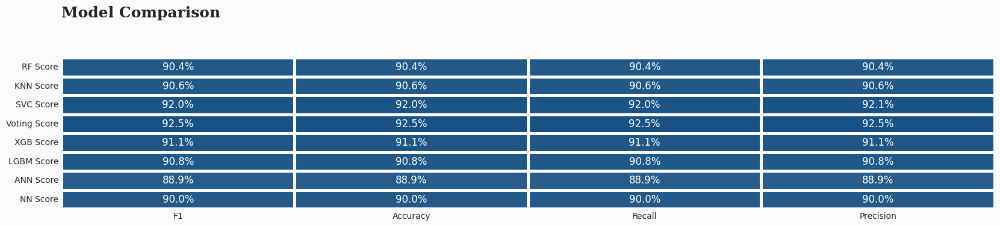

In [113]:
df_models = round(pd.concat([rf_df,
                             knn_df,
                             svc_df,
                             voting_df,
                             xgb_df,
                             lgbm_df,
                             ann_df,
                             nn_df
                            ], axis=1),8)
import matplotlib
colors = ["lightgray","lightgray","#0f4c81"]
colormap = matplotlib.colors.LinearSegmentedColormap.from_list("", colors)

background_color = "#fbfbfb"

fig = plt.figure(figsize=(20,18)) # create figure
gs = fig.add_gridspec(4, 4)
gs.update(wspace=0.1, hspace=0.5)
ax0 = fig.add_subplot(gs[0, :])

sns.heatmap(df_models.T, cmap=colormap,annot=True,fmt=".1%",vmin=0,vmax=0.95, linewidths=2.5,cbar=False,ax=ax0,annot_kws={"fontsize":12})
fig.patch.set_facecolor(background_color) # figure background color
ax0.set_facecolor(background_color) 

ax0.text(0,-2.15,'Model Comparison',fontsize=18,fontweight='bold',fontfamily='serif')
ax0.tick_params(axis=u'both', which=u'both',length=0)
plt.show()


In [114]:
df_models.T

,F1,Accuracy,Recall,Precision
RF Score,0.903750,0.90375,0.90375,0.903775
KNN Score,0.906245,0.90625,0.90625,0.906379
SVC Score,0.919972,0.92000,0.92000,0.920508
Voting Score,0.925000,0.92500,0.92500,0.925000
XGB Score,0.911250,0.91125,0.91125,0.911253
LGBM Score,0.907500,0.90750,0.90750,0.907500
ANN Score,0.888694,0.88875,0.88875,0.889442
NN Score,0.899988,0.90000,0.90000,0.900256


In [115]:
np.array(df_models.T['Accuracy'])

array([0.90375, 0.90625, 0.92   , 0.925  , 0.91125, 0.9075 , 0.88875,
       0.9    ])

In [116]:
!pip install eli5

In [117]:
!pip install shap

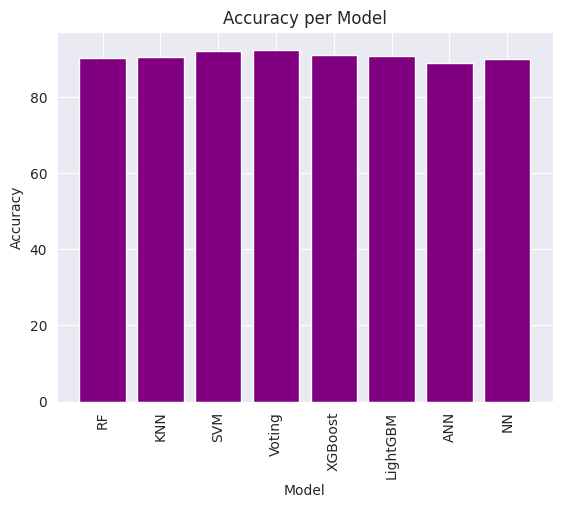

<Figure size 640x480 with 0 Axes>

In [118]:
import matplotlib.pyplot as plt
import numpy as np

# Assuming df_models has 'Model' and 'Accuracy' columns
objects = ['RF', 'KNN', 'SVM', 'Voting', 'XGBoost', 'LightGBM', 'ANN','NN']
performance = df_models.T['Accuracy'] * 100

plt.bar(objects, performance, color='purple')
plt.xticks(rotation=90)
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Accuracy per Model')

plt.show()
plt.savefig('accuracy_per_model.png')

In [119]:
# RF Score	0.903750	0.90375	0.90375	0.903775
# KNN Score	0.906245	0.90625	0.90625	0.906379
# SVC Score	0.919972	0.92000	0.92000	0.920508
# Voting Score	0.925000	0.92500	0.92500	0.925000
# XGB Score	0.911250	0.91125	0.91125	0.911253
# LGBM Score	0.907500	0.90750	0.90750	0.907500
# ANN Score	0.881214	0.88125	0.88125	0.881644
# NN Score	0.894996	0.89500	0.89500	0.895093

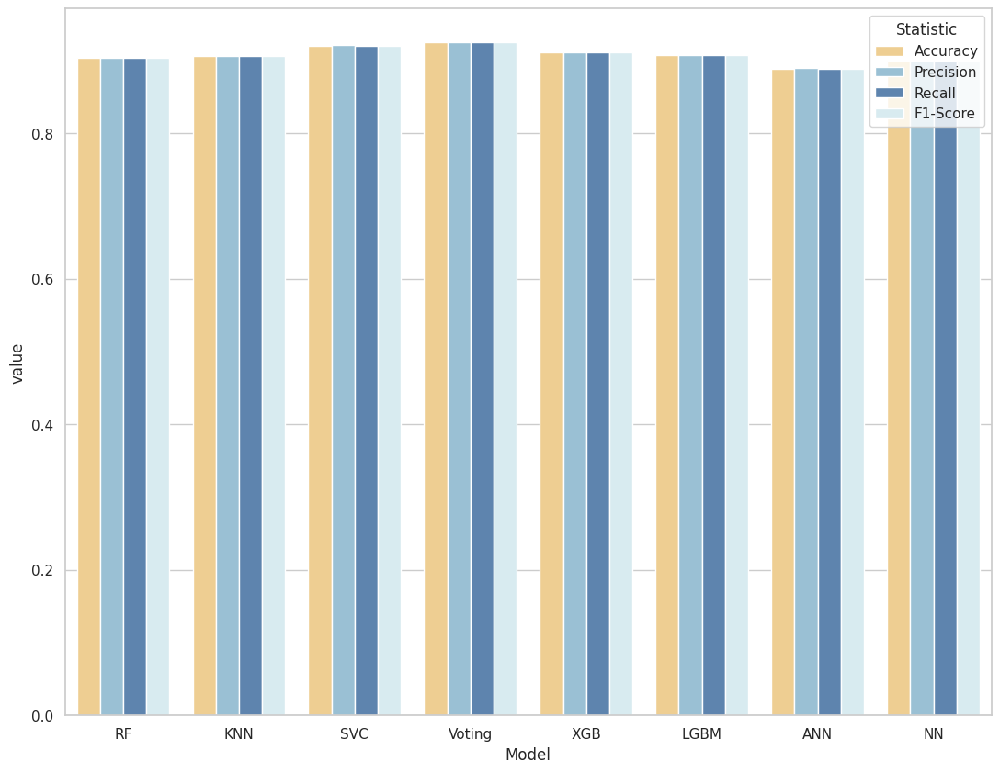

In [120]:
from sklearn.metrics import classification_report,accuracy_score,precision_score,recall_score,f1_score
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="whitegrid", color_codes=True)

titanic = sns.load_dataset("titanic")
data = titanic.groupby("deck").size()  # data underlying bar plot in question
''' Precision= TP/(TP+FP)
    Recall=TP/(TP+FN)
    F1-Score = 2PR/(9P+R)'''
pal = sns.color_palette("RdYlBu_r", len(data))
rank = data.argsort().argsort()  # http://stackoverflow.com/a/6266510/1628638
SR=pd.DataFrame([['RF',df_models.T['Accuracy'][0], df_models.T['Precision'][0], df_models.T['Recall'][0],df_models.T['F1'][0]],
                 ['KNN',df_models.T['Accuracy'][1], df_models.T['Precision'][1], df_models.T['Recall'][1],df_models.T['F1'][1]],    
                 ['SVC',df_models.T['Accuracy'][2], df_models.T['Precision'][2], df_models.T['Recall'][2],df_models.T['F1'][2]], 
                 ['Voting',df_models.T['Accuracy'][3], df_models.T['Precision'][3], df_models.T['Recall'][3],df_models.T['F1'][3]], 
                 ['XGB',df_models.T['Accuracy'][4], df_models.T['Precision'][4], df_models.T['Recall'][4],df_models.T['F1'][4]], 
                 ['LGBM',df_models.T['Accuracy'][5], df_models.T['Precision'][5], df_models.T['Recall'][5],df_models.T['F1'][5]], 
                 ['ANN',df_models.T['Accuracy'][6], df_models.T['Precision'][6], df_models.T['Recall'][6],df_models.T['F1'][6]], 
                 ['NN',df_models.T['Accuracy'][7], df_models.T['Precision'][7], df_models.T['Recall'][7],df_models.T['F1'][7]], 
                 ], columns = ['Model','Accuracy', 'Precision','Recall','F1-Score'])

SR = pd.melt(frame = SR,
             id_vars = 'Model',
             var_name = 'Statistic',
             value_name = 'value')

fig, ax = plt.subplots(figsize = (13, 10))

sns.barplot(ax = ax, data = SR, x = 'Model', y = 'value', hue = 'Statistic', palette=np.array(pal[::-1])[rank])

plt.show()

<center><h1 style='background-color:#99ccff;padding:10px;font-family:courier'>📗 XAI in LIME</h1></center>

In [121]:
!pip install lime

In [122]:
import lime
import lime.lime_tabular

explainer = lime.lime_tabular.LimeTabularExplainer(X_train.values, feature_names = X.columns.tolist(),
                                                  class_names=['bad', 'good'])

In [123]:
from sklearn.ensemble import VotingClassifier

voting  = VotingClassifier(estimators=[('SVC', svc), ('RF', rnd_clf), ('GNB', xgb_clf)], voting='soft')
voting.fit(X_train,y_train)

VotingClassifier(estimators=[('SVC',
                              SVC(C=100, coef0=1, degree=2, probability=True)),
                             ('RF',
                              RandomForestClassifier(criterion='entropy',
                                                     max_depth=20,
                                                     max_features='auto',
                                                     min_samples_leaf=2,
                                                     min_samples_split=5,
                                                     n_jobs=-1,
                                                     random_state=42)),
                             ('GNB',
                              XGBClassifier(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample...
                                            grow_policy=None,
                                            importance_type=None,
                                            interaction_constraints=None,
                                            learning_rate=0.2, max_bin=None,
                                            max_cat_threshold=None,
                                            max_cat_to_onehot=None,
                                            max_delta_step=None, max_depth=7,
                                            max_leaves=None, min_child_weight=3,
                                            missing=nan,
                                            monotone_constraints=None,
                                            multi_strategy=None,
                                            n_estimators=100, n_jobs=None,
                                            num_parallel_tree=None,
                                            random_state=42, ...))],
                 voting='soft')

In [124]:
# one - good
# zero - bad

j=47
choosen_instance = x_test.iloc[[j]].values[0]

exp = explainer.explain_instance(choosen_instance, voting.predict_proba,num_features=10,top_labels=1)

exp.show_in_notebook(show_table=True, show_all=False)

In [125]:
j=46
choosen_instance = x_test.iloc[[j]].values[0]

exp = explainer.explain_instance(choosen_instance, voting.predict_proba,num_features=10,top_labels=1)

exp.show_in_notebook(show_table=True, show_all=False)

In [126]:
j=45
choosen_instance = x_test.iloc[[j]].values[0]

exp = explainer.explain_instance(choosen_instance, voting.predict_proba,num_features=10,top_labels=1)

exp.show_in_notebook(show_table=True, show_all=False)

In [127]:
j=4
choosen_instance = x_test.iloc[[j]].values[0]

exp = explainer.explain_instance(choosen_instance, voting.predict_proba,num_features=10,top_labels=1)

exp.show_in_notebook(show_table=True, show_all=False)

In [128]:
j=6
choosen_instance = x_test.iloc[[j]].values[0]

exp = explainer.explain_instance(choosen_instance, voting.predict_proba,num_features=10,top_labels=1)

exp.show_in_notebook(show_table=True, show_all=False)

In [129]:
j=49
choosen_instance = x_test.iloc[[j]].values[0]

exp = explainer.explain_instance(choosen_instance, voting.predict_proba,num_features=10,top_labels=1)

exp.show_in_notebook(show_table=True, show_all=False)

<center><h1 style='background-color:#99ccff;padding:10px;font-family:courier'>📗 SHAP</h1></center>

In [130]:
!pip install shap

In [131]:
import shap
from sklearn.ensemble import VotingClassifier

# Create a SHAP explainer
explainer = shap.KernelExplainer(voting.predict_proba, shap.sample(X_train, 100))

# Calculate SHAP values
shap_values = explainer.shap_values(x_test)

  0%|          | 0/800 [00:00<?, ?it/s]

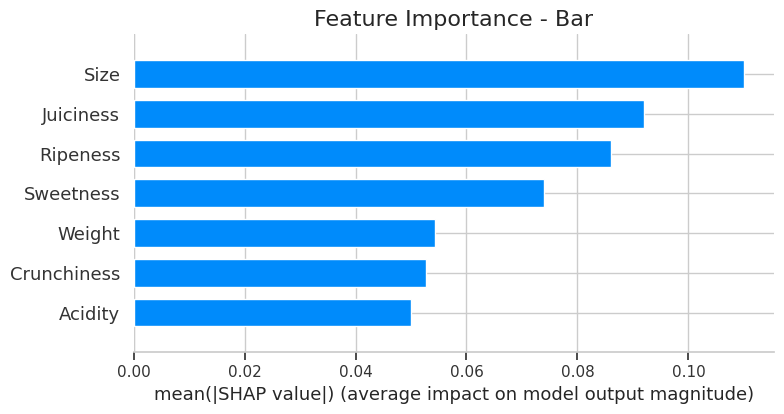

In [132]:
# Bar plot
plt.figure(figsize=(20, 14))
shap.summary_plot(shap_values[1], x_test, plot_type="bar", show=False)
plt.title("Feature Importance - Bar", fontsize=16)

# Adjust layout and display the plots side by side
plt.tight_layout()
plt.show()

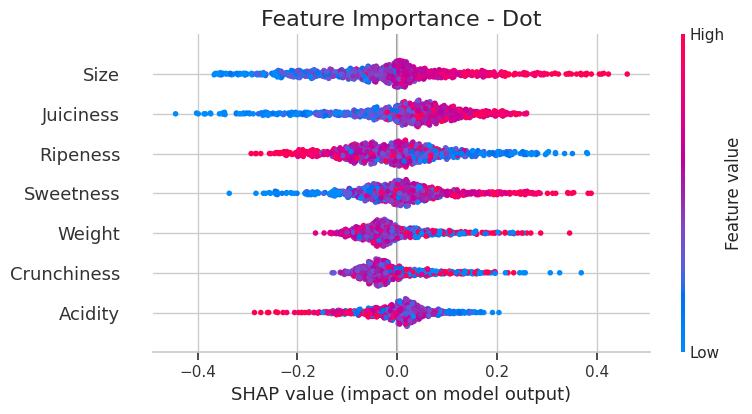

In [133]:
# Dot plot
plt.figure(figsize=(20, 14))
shap.summary_plot(shap_values[1], x_test, plot_type="dot", show=False)
plt.title("Feature Importance - Dot", fontsize=16)

# Adjust layout and display the plots side by side
plt.tight_layout()
plt.show()

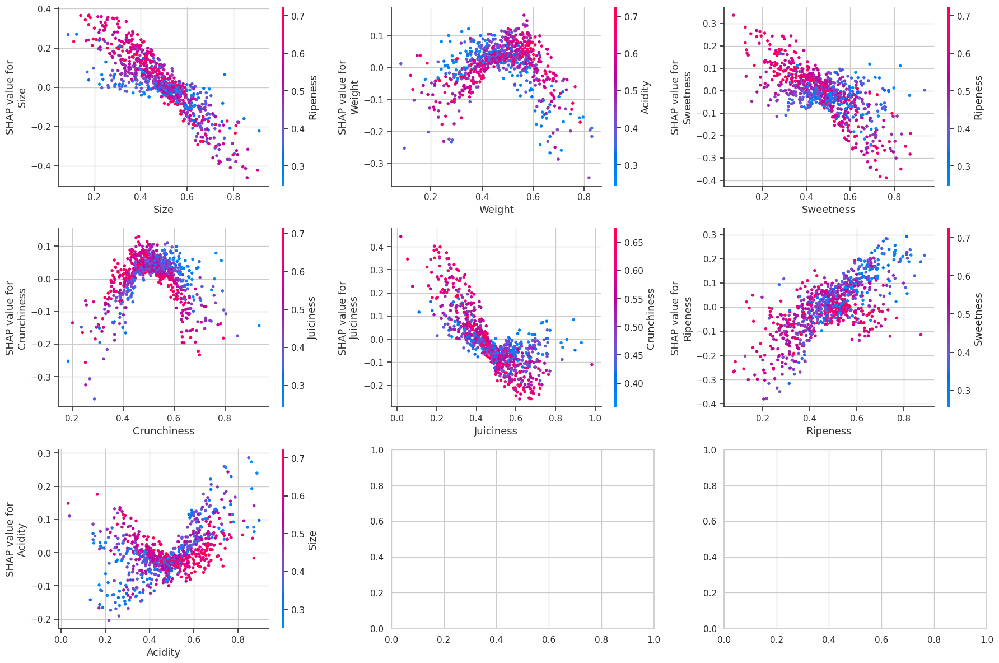

In [134]:
num_cols = min(3, len(x_test.columns))
num_rows = (len(x_test.columns) + num_cols - 1) // num_cols

# Assuming shap_values is a list, and you want the SHAP values for the first class
shap_values_class = shap_values[0]

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(6*num_cols, 4*num_rows))

for i, ind in enumerate(x_test.columns):
    row = i // num_cols
    col = i % num_cols

    shap.dependence_plot(ind=ind, shap_values=shap_values_class, features=x_test, feature_names=x_test.columns, ax=axes[row, col], show=False)

plt.tight_layout()
plt.show()